# DATA ANALYSIS

# DATA

In [80]:
%pip install mplcursors 
%pip install folium # For mapping

Note: you may need to restart the kernel to use updated packages.


Note: you may need to restart the kernel to use updated packages.


In [81]:
from gensim.models import word2vec
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import umap
import pacmap
import numpy as np
import csv
import matplotlib.pyplot as plt
import json
import re
from matplotlib.colors import Normalize
import mplcursors
from matplotlib.colors import LinearSegmentedColormap
from gensim.models import Word2Vec
import plotly.express as px


In [82]:
with open('../Data/sequences.csv', 'r') as f:
    reader = csv.reader(f)
    sequences = list(reader)

In [83]:
f = open('../Data/data.json')
data = json.load(f)

a = open('../Data/added_data.json')
added_data = json.load(a)

In [84]:
model= word2vec.Word2Vec.load('../Data/Models/model_5e_100d.model')

In [85]:
# model = Word2Vec(sentences=sequences,     # This is the data that we wish to create notes on. This will take all unique words (stations) and put them in the NN
#                 vector_size=5,          # Amount of dimension
#                 min_count=5,      # If the number of occurences of this station is less than 10, then we are not interested in having it in our embedding. -- THIS NEED TO BE LOOKED AT
#                 workers=4,                # Amount of cores used for training and so forth.
#                 compute_loss=True,        # Used for logging
#                 alpha=0.01,               # Learning rate. Default is 0.025, but due to the relatively low epochs, a higher lr were decided to give a quicker lowest loss-model
#                 window=5,                 # Due to our sequences only being of length two, when using skip-gram, out window only consists of either the next or the prev entry (as there isn't any other elements in the sequence)
#                 sg=1,                     # Skip-gram. WHY DO WE CHOOSE THIS OVER CBoW? 
#                 # batch_words=10000,         # Batching training together for more effeciency
#                 epochs=5
#                 )  

In [86]:
# Create a dictionary to map addresses to their corresponding embeddings
journey_embeddings = {}
for journey in sequences:
    for place in journey:
        try:
            journey_id = place  # Convert the journey list to a tuple to use as a dictionary key
            journey_embeddings[journey_id] = model.wv[journey_id]
        except KeyError:
            # Handle cases where the journey is not present in the Word2Vec model
            pass

# Convert dictionary to numpy array
X = np.array(list(journey_embeddings.values()))

# Create a list of all addresses
journey_ids = list(journey_embeddings.keys())

# Create a dictionary mapping addresses to their index in the numpy array
journey_idx = {journey_id: idx for idx, journey_id in enumerate(journey_ids)}

In [87]:
X = model.wv.vectors

#pacmap
embedding = pacmap.PaCMAP(n_components=2, n_neighbors=20, MN_ratio=0.5, FP_ratio=2.0) 
proj_pacmap = embedding.fit_transform(X, init="pca")

# tsne
def tsne_plot(X):
    X=np.array(X)
    proj = TSNE(perplexity=20).fit_transform(X)
    return proj
proj_tsne=tsne_plot(X)

# UMAP 
proj_umap = umap.UMAP(n_components=2, n_neighbors=20, metric='cosine').fit_transform(X)

# # pca 
# pca = PCA(n_components=2)
# proj_pca=pca.fit_transform(X)


In [88]:

# Calculate explained variance ratio


# pca 
pca = PCA()
proj_pca=pca.fit_transform(X)

exp_var_cumul = np.cumsum(pca.explained_variance_ratio_)

# Plot
fig = px.area(
    x=range(1, exp_var_cumul.shape[0] + 1),
    y=exp_var_cumul,
    labels={"x": "# Components", "y": "Explained Variance"}
)
fig.show()

In [89]:
import plotly.express as px
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from gensim.models import Word2Vec

# Assuming you have your word2vec data stored in X

# Perform PCA
pca = PCA()
proj_pca = pca.fit_transform(X)

# Calculate absolute explained variances
exp_var = pca.explained_variance_

# Plot
fig = px.area(
    x=range(1, exp_var.shape[0] + 1),
    y=exp_var,
    labels={"x": "# Components", "y": "Explained Variance"}
)
fig.show()


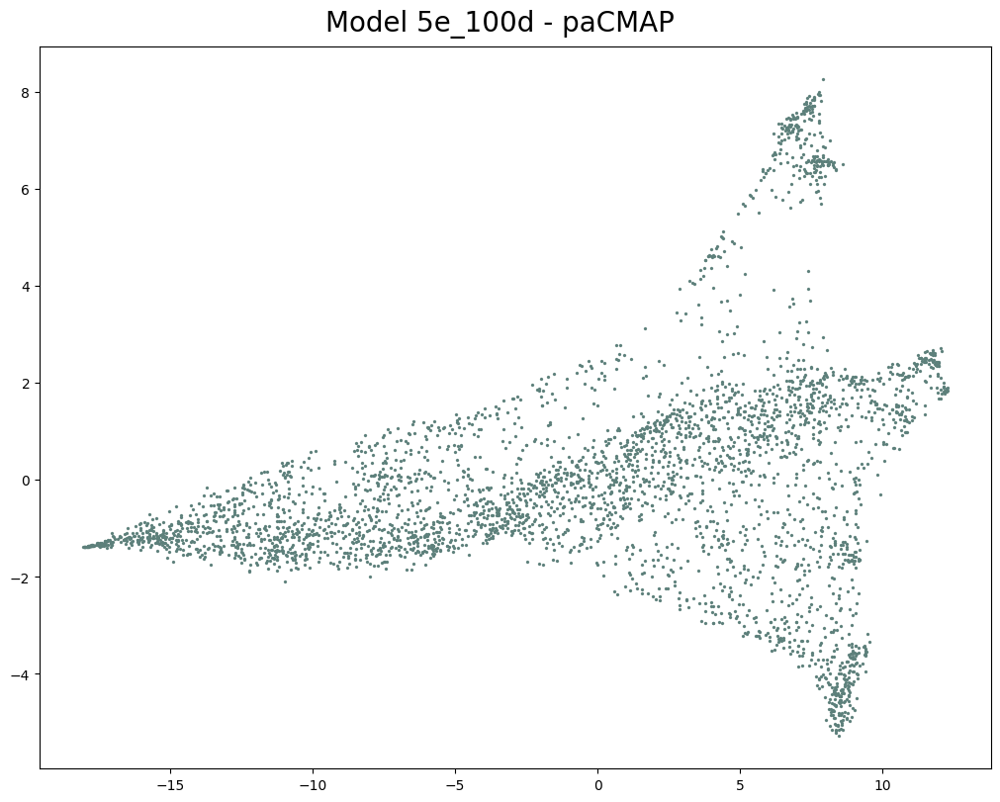

In [90]:

fig, ax = plt.subplots(1, 1, figsize=(10, 8), layout="constrained")

#Plot all city
plt.scatter(
    [proj_pacmap[journey_idx[journey_id]][0] for journey_id in journey_ids],
    [proj_pacmap[journey_idx[journey_id]][1] for journey_id in journey_ids],
    lw=0.1, s=5, marker='o', c="#5D807B"
)

fig.suptitle('Model 5e_100d - paCMAP', fontsize=20)

plt.show()

In [1]:
import plotly.express as px
import pandas as pd

# Create a Pandas DataFrame
df = pd.DataFrame(data=proj_pacmap, columns=['Dimension 1', 'Dimension 2'])
df['Station Name'] = journey_ids

# Create the scatter plot using Plotly Express
#fig = px.scatter(df, x='Dimension 1', y='Dimension 2', hover_data={'Station Name': True}, text=station_names)
fig = px.scatter(df, x='Dimension 1', y='Dimension 2', hover_data={'Station Name': True})

# Customize the size and color of the points
fig.update_traces(marker=dict(size=5,  # Adjust the size of the points as needed
                               color='#5D807B',  # Change the color of the points
                               opacity=1.0),  # Adjust the opacity of the points
                  selector=dict(mode='markers'))

# Update the layout if needed
fig.update_layout(
    title="PaCMAP Visualization",
    xaxis_title="Dimension 1",
    yaxis_title="Dimension 2",
    height=800,  # Set the height of the plot (in pixels)
    plot_bgcolor='rgba(255, 255, 255, 0.8)',  # Set plot background color to lighter one

)

# Show the plot
fig.show()


NameError: name 'proj_pacmap' is not defined

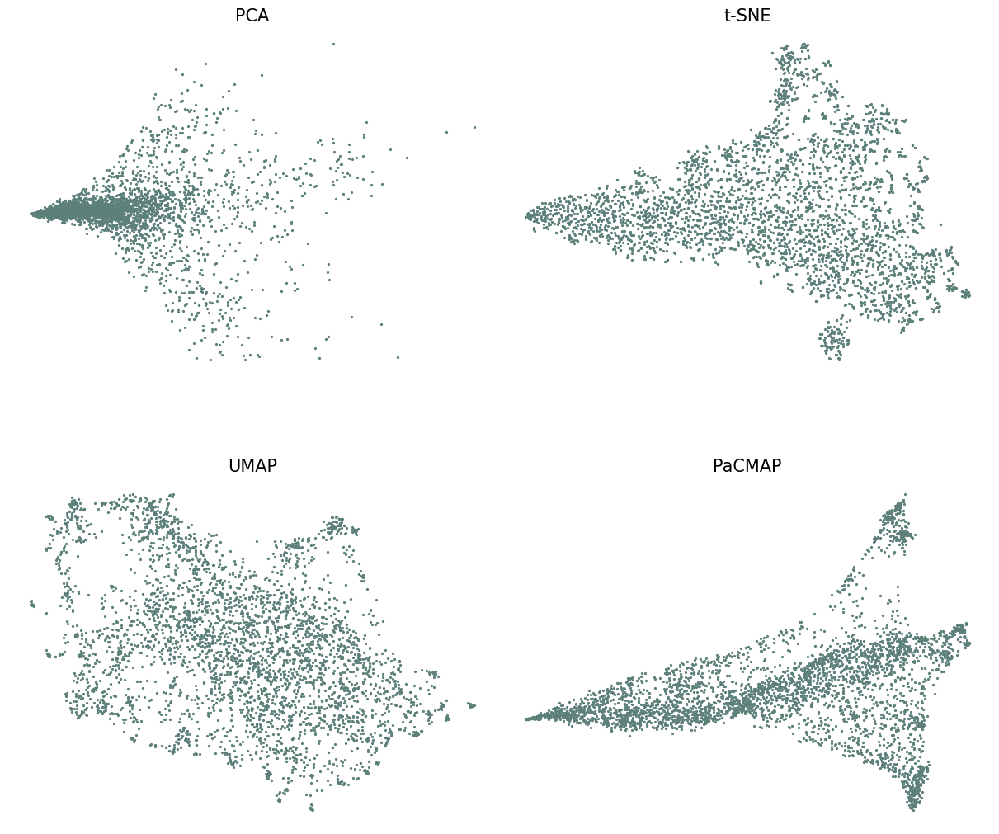

In [92]:
fig, ax = plt.subplots(2, 2, figsize=(12, 10), layout="constrained", gridspec_kw={'wspace': 0.0, 'hspace': 0.2})
xs = [proj_pca, proj_tsne, proj_umap, proj_pacmap]  # Use xs to select different dimensionality reduction results
ts = ["PCA", "t-SNE", "UMAP", "PaCMAP"]
s = 0

for row in ax:
    for col in row:
        col.set_title(ts[s], fontsize=15)
        col.scatter(
            [xs[s][journey_idx[journey_id]][0] for journey_id in journey_ids],
            [xs[s][journey_idx[journey_id]][1] for journey_id in journey_ids],
            lw=0.1, s=5, c='#5D807B'
        )
        s += 1
        col.axis('off')

# Custom legend
# fig.suptitle('Dimensionality reduction ', fontsize=20, y=1.1)
plt.show()


_____________________________________________________________________

# COUNT

In [93]:
counts_to_labels = {100: '5-100', 1000: '101-1000', 5000: '1001-5000', 10000: '5001-10000', 50000: '10000-50000', 100000: '50001-100000', 100001: '100000+'}

In [94]:
address_count_seq = {}
for seq in sequences:
    for place in seq:
        if place in address_count_seq:
            address_count_seq[place] += 1
        else:
            address_count_seq[place] = 1


from collections import Counter

# Count occurrences of each number of mentions of addresses. So counting how many addresses was mentioned once and so on
address_counts = Counter(address_count_seq.values())


# Sort the counts by their keys (number of mentions), in descending order
sorted_counts = sorted(address_counts.items(), key=lambda x: x[0], reverse=True)


In [95]:

address_cluster_count = {}

for address in address_count_seq.keys():
      count = address_count_seq[address]
      if 0 <= count <= 100:
         address_cluster_count[address] = 100
      elif 101 <= count <= 1000:
         address_cluster_count[address] = 1000
      elif 1001 <= count <= 5000:
         address_cluster_count[address] = 5000
      elif 5001 <= count <= 10000:
         address_cluster_count[address] = 10000
      elif 10001 <= count <= 50000:
         address_cluster_count[address] = 50000
      elif 50001 <= count <= 100000:
         address_cluster_count[address] = 100000
      elif 100001 <= count:
         address_cluster_count[address] = 100001
      else:
         print("address was: ", address)
         address_cluster_count[address] = 0 


In [96]:
from collections import Counter

# Count occurrences of each zip code
count_counts = Counter(address_cluster_count.values())

# Print the zip code counts
for occurrence, count in sorted(count_counts.items()):
    print(f"Count {occurrence}: {count} occurrences")

Count 100: 4063 occurrences
Count 1000: 833 occurrences
Count 5000: 265 occurrences
Count 10000: 57 occurrences
Count 50000: 76 occurrences
Count 100000: 22 occurrences
Count 100001: 9 occurrences


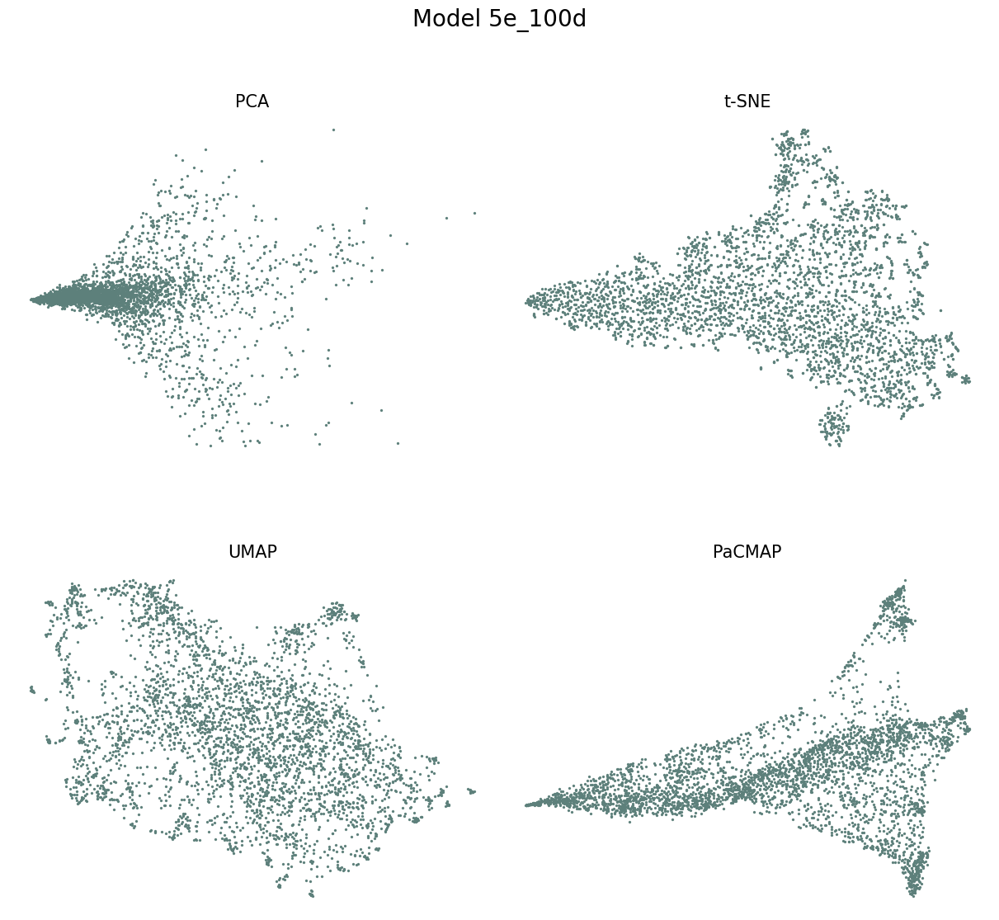

In [97]:

# Define color palette for zip codes
count_colors = {}  # Dictionary to map zip codes to colors
unique_count_codes = sorted(counts_to_labels.keys())
num_colors = len(unique_count_codes) #change this
color_palette = ['#ffe119', '#f58231', '#3cb44b', '#42d4f4', '#4363d8', '#f032e6', '#e6194b']

for idx, count_code in enumerate(unique_count_codes):
    count_colors[count_code] = color_palette[idx]

fig, ax = plt.subplots(2, 2, figsize=(12, 10), layout="constrained", gridspec_kw={'wspace': 0.0, 'hspace': 0.2})
xs = [proj_pca, proj_tsne, proj_umap, proj_pacmap]  # Use xs to select different dimensionality reduction results
ts = ["PCA", "t-SNE", "UMAP", "PaCMAP"]
s = 0

for row in ax:
    for col in row:
        col.set_title(ts[s], fontsize=15)
        col.scatter(
            [xs[s][journey_idx[journey_id]][0] for journey_id in journey_ids],
            [xs[s][journey_idx[journey_id]][1] for journey_id in journey_ids],
            lw=0.1, s=5, c='#5D807B'
        )
        s += 1
        col.axis('off')

# Custom legend
fig.suptitle('Model 5e_100d', fontsize=20, y=1.1)
plt.show()


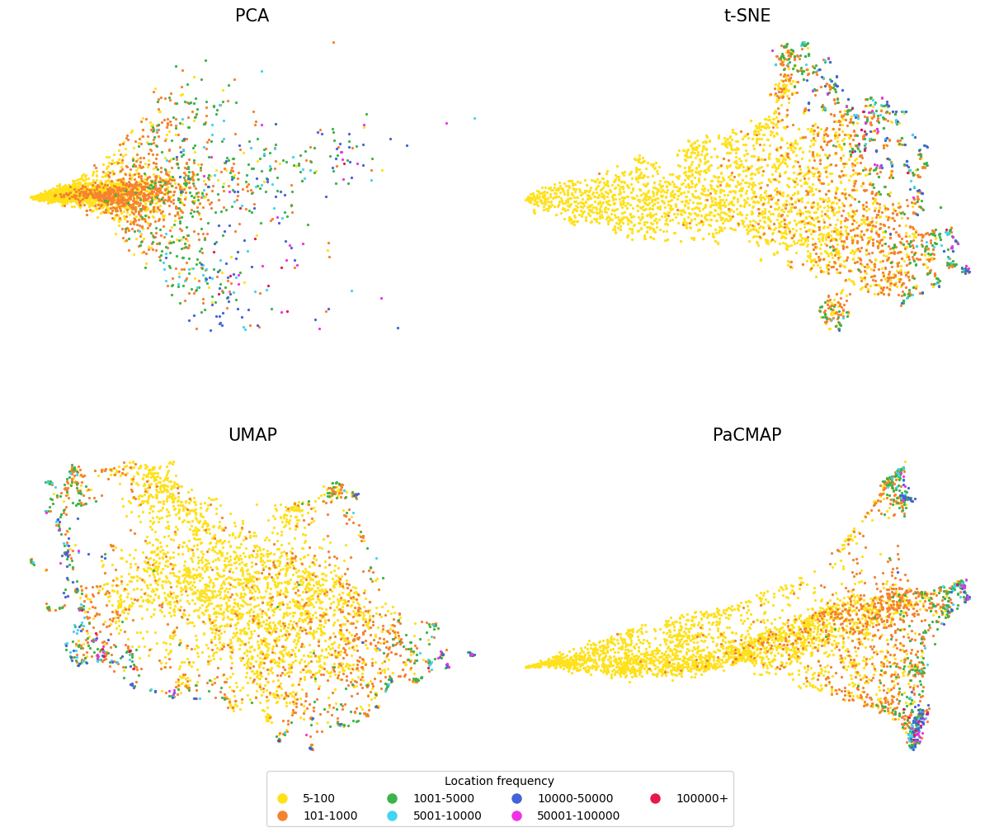

In [98]:

# Define color palette for zip codes
count_colors = {}  # Dictionary to map zip codes to colors
unique_count_codes = sorted(counts_to_labels.keys())
num_colors = len(unique_count_codes) #change this
color_palette = ['#ffe119', '#f58231', '#3cb44b', '#42d4f4', '#4363d8', '#f032e6', '#e6194b']

for idx, count_code in enumerate(unique_count_codes):
    count_colors[count_code] = color_palette[idx]

fig, ax = plt.subplots(2, 2, figsize=(12, 10), layout="constrained", gridspec_kw={'wspace': 0.0, 'hspace': 0.2})
xs = [proj_pca, proj_tsne, proj_umap, proj_pacmap]  # Use xs to select different dimensionality reduction results
ts = ["PCA", "t-SNE", "UMAP", "PaCMAP"]
s = 0

for row in ax:
    for col in row:
        col.set_title(ts[s], fontsize=15)

        for current_count_code in unique_count_codes:
            relevant_addresses = []
            for address, count_code in address_cluster_count.items():
                if address in journey_ids:
                    if current_count_code == count_code:
                        relevant_addresses.append(address)

            relevant_journeys_zip = [journey_id for journey_id in relevant_addresses]
            col.scatter(
                [xs[s][journey_idx[journey_id]][0] for journey_id in relevant_journeys_zip],
                [xs[s][journey_idx[journey_id]][1] for journey_id in relevant_journeys_zip],
                lw=0.1, s=5, label=current_count_code, c=count_colors[current_count_code]
            )
        #  # Add labels to stations makes it impossible to read 
        #     for journey_id in relevant_journeys_zip:
        #         x_coord = xs[s][journey_idx[journey_id]][0]
        #         y_coord = xs[s][journey_idx[journey_id]][1]
        #         col.text(x_coord, y_coord, journey_id, fontsize=8)  # Adjust fontsize as needed
            
        s += 1
        col.axis('off')

# Custom legend
handles = [plt.Line2D([0], [0], marker='o', color='w', markersize=10, markerfacecolor=count_colors[count_code], label=counts_to_labels[count_code]) for count_code in unique_count_codes]
fig.legend(handles= handles, loc="outside lower center", ncol=4, title='Location frequency')
#fig.suptitle('Model 5e_100d - colored by count', fontsize=20, y=1.1)
plt.show()


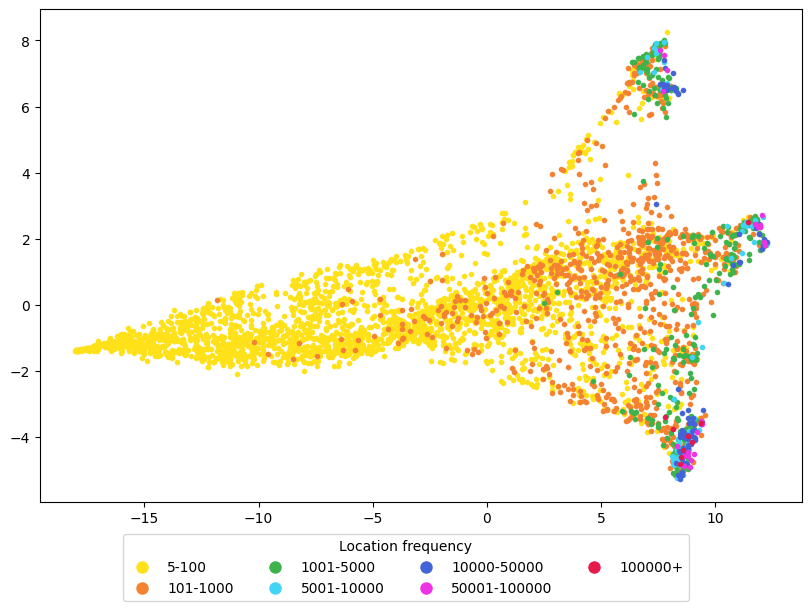

In [99]:

# Define color palette for zip codes
count_colors = {}  # Dictionary to map zip codes to colors
unique_count_codes = sorted(counts_to_labels.keys())
num_colors = len(unique_count_codes) #change this
color_palette = ['#ffe119', '#f58231', '#3cb44b', '#42d4f4', '#4363d8', '#f032e6', '#e6194b']

for idx, count_code in enumerate(unique_count_codes):
    count_colors[count_code] = color_palette[idx]

fig, ax = plt.subplots(1, 1, figsize=(8, 6), layout="constrained", gridspec_kw={'wspace': 0.0, 'hspace': 0.2})


for current_count_code in unique_count_codes:
    relevant_addresses = []
    for address, count_code in address_cluster_count.items():
        if address in journey_ids:
            if current_count_code == count_code:
                relevant_addresses.append(address)

    relevant_journeys_zip = [journey_id for journey_id in relevant_addresses]
    plt.scatter(
        [proj_pacmap[journey_idx[journey_id]][0] for journey_id in relevant_journeys_zip],
        [proj_pacmap[journey_idx[journey_id]][1] for journey_id in relevant_journeys_zip],
        lw=0.1, s=15, label=current_count_code, c=count_colors[current_count_code]
    )
# Custom legend
handles = [plt.Line2D([0], [0], marker='o', color='w', markersize=10, markerfacecolor=count_colors[count_code], label=counts_to_labels[count_code]) for count_code in unique_count_codes]
fig.legend(handles= handles, loc="outside lower center", ncol=4, title='Location frequency')
#fig.suptitle('Model 5e_100d - colored by count', fontsize=20, y=1.1)
plt.show()


### Metro

In [100]:
stations_with_metro = []
for location in journey_ids:
    if '(Metro)' in location:
        stations_with_metro.append(location)

City = ["Nørrebro St. (Metro)", "Nørrebros Runddel St. (Metro)", "Nuuks Plads St. (Metro)", "Axelm Møllers Have St. (Metro)", 
      "Frederiksberg St. (Metro)", "Frederiksberg Allé St. (Metro)", "Enghave Plads St. (Metro)", "København H St. (Metro)", "København H (Metro)",
      "Rådhuspladsen St. (Metro)", "Gammel Strand St. (Metro)", "Kongens Nytorv St. (Metro)", "Marmorkirken St. (Metro)",
       "Østerport St. (Metro)", "Trianglen St. (Metro)", "Poul Henningsens Plads St. (Metro)", "Vibenhus Runddel St. (Metro)",
        "Skjolds Plads St. (Metro)", "Nordhavn St. (Metro)", "Orientkaj St. (Metro)"]

M1_2 = ["Vanløse St. (Metro)", "Flintholm St. (Metro)", "Lindevang St. (Metro)", "Fasanvej St. (Metro)", 
      "Frederiksberg St. (Metro)", "Forum St. (Metro)", "Nørreport St. (Metro)", "Kongens Nytorv St. (Metro)",
      "Christianshavn St. (Metro)"]
M1 = ["Islands Brygge St. (Metro)", "DR Byen St. (Metro)", "Sundby St. (Metro)", "Bella Center St. (Metro)", "Ørestad St. (Metro)", "Vestamager St. (Metro)"]
M2 = ["Amagerbro St. (Metro)", "Lergravsparken St. (Metro)", "Øresund St. (Metro)",
      "Amager Strand St. (Metro)", "Femøren St. (Metro)", "Kastrup St. (Metro)", "Københavns Lufthavn St. (Metro)"]

#color_to_metro= {"City": "Red", "M2": "Yellow", "M1": "Green", "M1_2": "Purple", "Metro": "Black"}
color_to_metro= {"Red": "City" , "Yellow":  "M2", "Green": "M1", "Purple": "M1_2"}

# Create the plots

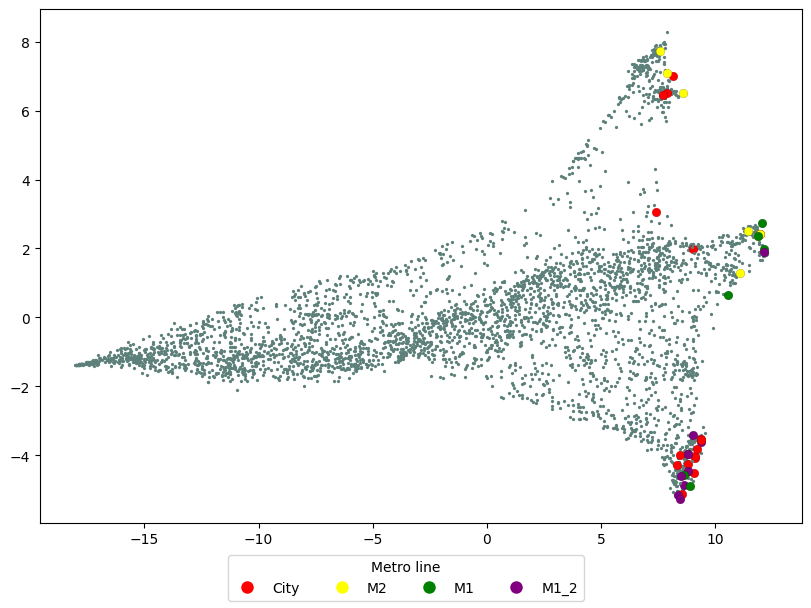

In [101]:
# Define color palette for zip codes
unique_metroes = color_to_metro.keys()
color_palette = ["Red", "Yellow", "Green", "Purple"]
colors = {}
for idx, metro in enumerate(unique_metroes):
    colors[metro] = color_palette[idx]


fig, ax = plt.subplots(1, 1, figsize=(8, 6), layout="constrained")
# ax.xaxis.set_visible(False)
# ax.yaxis.set_visible(False)

for current_count_code in unique_count_codes:
    relevant_addresses = []
    for address, count_code in address_cluster_count.items():
        if address in journey_ids:
            if current_count_code == count_code:
                relevant_addresses.append(address)

    relevant_journeys_zip = [journey_id for journey_id in relevant_addresses]
    #plot all without metro
    plt.scatter(
        [proj_pacmap[journey_idx[journey_id]][0] for journey_id in relevant_journeys_zip if journey_id not in stations_with_metro],
        [proj_pacmap[journey_idx[journey_id]][1] for journey_id in relevant_journeys_zip if journey_id not in stations_with_metro],
        lw=0.1, s=5, label=current_count_code, facecolor='#5D807B'
    )

    # plt.scatter(
    #     [proj_pacmap[journey_idx[journey_id]][0] for journey_id in relevant_journeys_zip if journey_id in stations_with_metro],
    #     [proj_pacmap[journey_idx[journey_id]][1] for journey_id in relevant_journeys_zip if journey_id in stations_with_metro],
    #     lw=0.1, s=40, label=current_count_code, edgecolors='black', facecolor='none'
    # )

    #Plot all city
    plt.scatter(
        [proj_pacmap[journey_idx[journey_id]][0] for journey_id in relevant_journeys_zip if journey_id in City],
        [proj_pacmap[journey_idx[journey_id]][1] for journey_id in relevant_journeys_zip if journey_id in City],
        lw=0.1, s=40, marker='o', edgecolor='black', facecolor='Red', label="City"
    )

    #Plot all m1_2
    plt.scatter(
        [proj_pacmap[journey_idx[journey_id]][0] for journey_id in relevant_journeys_zip if journey_id in M1_2],
        [proj_pacmap[journey_idx[journey_id]][1] for journey_id in relevant_journeys_zip if journey_id in M1_2],
        lw=0.1, s=40, marker='o', edgecolor='black', facecolor='Purple', label="M1_2"
    )

    #Plot all m2
    plt.scatter(
        [proj_pacmap[journey_idx[journey_id]][0] for journey_id in relevant_journeys_zip if journey_id in M2],
        [proj_pacmap[journey_idx[journey_id]][1] for journey_id in relevant_journeys_zip if journey_id in M2],
        lw=0.1, s=40, marker='o', edgecolor='black', facecolor='Yellow', label="M2"
    )

      #Plot all m1
    plt.scatter(
        [proj_pacmap[journey_idx[journey_id]][0] for journey_id in relevant_journeys_zip if journey_id in M1],
        [proj_pacmap[journey_idx[journey_id]][1] for journey_id in relevant_journeys_zip if journey_id in M1],
        lw=0.1, s=40, marker='o', edgecolor='black', facecolor='Green', label="M1"
    )


# for journey_id in stations_with_metro:
#     x_coord = proj_pacmap[journey_idx[journey_id]][0]
#     y_coord = proj_pacmap[journey_idx[journey_id]][1]
#     plt.text(x_coord, y_coord, journey_id, fontsize=8)  # Adjust fontsize as needed

# Custom legend
handles = [plt.Line2D([0], [0], marker='o', color='w', markersize=10, markerfacecolor=colors[metro], label=color_to_metro[metro]) for metro in unique_metroes]
fig.legend(handles= handles, loc="outside lower center", ncol=5, title='Metro line')
#fig.suptitle('Model 5e_100d - colored metros', fontsize=20)

plt.show()

_____________________________________________________________________

# ZIPCODES

In [102]:
def getZip(info):
    pattern_zip = '\d{4}'
    pattern_denmark = 'anmark'
    match_zip = re.search(pattern_zip, info)
    match_denmark = re.search(pattern_denmark, info)
    if match_zip is not None and match_denmark is not None:
        return match_zip.group()
    else :
        return
    

In [103]:
pattern = r'\d.*'

def get_modified (location):
    location = (re.sub(pattern, '', location)).strip()
    if location == '':
        return
    if location[-1] == '(':
        location = location[:-1]
    if location == 'Zoo':
        location = "Zoologisk Have"
    return location


In [104]:
address_cluster_zips = {}
address_more_cluster_zips = {}
address_kbh_cluster_zips = {}
zip_to_label = {'1000': 'Kbh K', '1700': 'Vesterbro', '2000': 'Frederiksberg', '2100': 'Østerbro', '2200': 'Nørrebro', 
                '2300': 'Kbh S', '2400': 'Kbh NV', '2500': 'Valby', '2600': 'Glostrup', '2700': 'Brønshøj', '2800': 'Lyngby', '2900': 'Hellerup', '2770': 'Kastrup'}
zip_to_label_clustered = {'2800': 'Nord', '1000': 'Midt', '2600': 'Vest', '2300' : 'Syd'}
zip_to_label_kbh_only = {'1000': 'Kbh K', '1500': 'Kbh V', '2100' : 'Kbh Ø', '2200' : 'Kbh N'}
wrong_addresses = []

In [105]:

for address, info in data.items():
    if info is not None: 
        zip_code = getZip(info['address'])  # Extract zip code from address can be empty
        if zip_code is not None:
            zip = int(zip_code)
            if 1000 <= zip <= 4999: #for now removing all failed zipcodes in Jylland
                if 1000 <= zip <= 1499:
                    #Kbh K
                    address_cluster_zips[address] = '1000'
                    address_more_cluster_zips[address] = '1000'
                    address_kbh_cluster_zips[address] = '1000'
                elif 1500 <= zip <= 1799:
                    #Kbh V
                    address_cluster_zips[address] = '1700'
                    address_more_cluster_zips[address] = '1000'
                    address_kbh_cluster_zips[address] = '1500'
                elif zip == 2000:
                    #Frederiksberg C
                    address_cluster_zips[address] = '2000'
                    address_more_cluster_zips[address] = '1000'
                    address_kbh_cluster_zips[address] = '1500'
                elif 2000 < zip < 2200: #2150 er Nordhavn
                    #Østerbro
                    address_cluster_zips[address] = '2100'
                    address_more_cluster_zips[address] = '1000'
                    address_kbh_cluster_zips[address] = '2100'
                elif 2200 <= zip < 2300:
                    #København N (Nørrebro)
                    address_cluster_zips[address] = '2200'
                    address_more_cluster_zips[address] = '1000'
                    address_kbh_cluster_zips[address] = '2200'
                elif 2300 <= zip < 2400:
                    #Amager Kbh S
                    address_cluster_zips[address] = '2300'
                    address_more_cluster_zips[address] = '2300'
                elif 2400 <= zip < 2500:
                    #Kbh NV
                    address_cluster_zips[address] = '2400'
                    address_more_cluster_zips[address] = '1000'
                elif 2500 <= zip < 2600:
                    #Valby
                    address_cluster_zips[address] = '2500'
                    address_more_cluster_zips[address] = '2300'
                elif 2600 <= zip < 2700:
                    #Glostrup
                    address_cluster_zips[address] = '2600'
                    address_more_cluster_zips[address] = '2600'
                elif zip == 2770 or zip == 2791:
                    #Kastrup Dragør
                    address_cluster_zips[address] = '2770'
                    address_more_cluster_zips[address] = '2300'
                elif 2700 <= zip < 2800:
                    #Brønshøj
                    address_cluster_zips[address] = '2700'
                    address_more_cluster_zips[address] = '1000'
                elif 2800 <= zip < 2900:
                    #Lyngby
                    address_cluster_zips[address] = '2800'
                    address_more_cluster_zips[address] = '2800'
                elif 2800 <= zip < 2900:
                    #Hellerup
                    address_cluster_zips[address] = '2900'
                    address_more_cluster_zips[address] = '2800'
            else: 
                wrong_addresses.append(address) #go through later


#run through the list of wrong addresses and try to find them in the added_data.json file to get the "correct" zipcode
for address in wrong_addresses:
    #find in json file
    if address in added_data:
        zip_code = getZip(added_data[address]['address'])
        if zip_code is not None:
            zip = int(zip_code)
            if 1000 <= zip <= 4999: #for now removing all failed zipcodes in Jylland
                if 1000 <= zip <= 1499:
                    #Kbh K
                    address_cluster_zips[address] = '1000'
                    address_more_cluster_zips[address] = '1000'
                    address_kbh_cluster_zips[address] = '1000'
                elif 1500 <= zip <= 1799:
                    #Kbh V
                    address_cluster_zips[address] = '1700'
                    address_more_cluster_zips[address] = '1000'
                    address_kbh_cluster_zips[address] = '1500'
                elif zip == 2000:
                    #Frederiksberg C
                    address_cluster_zips[address] = '2000'
                    address_more_cluster_zips[address] = '1000'
                    address_kbh_cluster_zips[address] = '1500'
                elif 2000 < zip < 2200: #2150 er Nordhavn
                    #Østerbro
                    address_cluster_zips[address] = '2100'
                    address_more_cluster_zips[address] = '1000'
                    address_kbh_cluster_zips[address] = '2100'
                elif 2200 <= zip < 2300:
                    #København N (Nørrebro)
                    address_cluster_zips[address] = '2200'
                    address_more_cluster_zips[address] = '1000'
                    address_kbh_cluster_zips[address] = '2200'
                elif 2300 <= zip < 2400:
                    #Amager Kbh S
                    address_cluster_zips[address] = '2300'
                    address_more_cluster_zips[address] = '2300'
                elif 2400 <= zip < 2500:
                    #Kbh NV
                    address_cluster_zips[address] = '2400'
                    address_more_cluster_zips[address] = '1000'
                elif 2500 <= zip < 2600:
                    #Valby
                    address_cluster_zips[address] = '2500'
                    address_more_cluster_zips[address] = '2300'
                elif 2600 <= zip < 2700:
                    #Glostrup
                    address_cluster_zips[address] = '2600'
                    address_more_cluster_zips[address] = '2600'
                elif zip == 2770 or zip == 2791:
                    #Kastrup Dragør
                    address_cluster_zips[address] = '2770'
                    address_more_cluster_zips[address] = '2300'
                elif 2700 <= zip < 2800:
                    #Brønshøj
                    address_cluster_zips[address] = '2700'
                    address_more_cluster_zips[address] = '1000'
                elif 2800 <= zip < 2900:
                    #Lyngby
                    address_cluster_zips[address] = '2800'
                    address_more_cluster_zips[address] = '2800'
                elif 2800 <= zip < 2900:
                    #Hellerup
                    address_cluster_zips[address] = '2900'
                    address_more_cluster_zips[address] = '2800'

In [106]:
from collections import Counter

# Count occurrences of each zip code
zip_code_counts = Counter(address_cluster_zips.values())

# Print the zip code counts
for zip_code, count in zip_code_counts.items():
    print(f"Zip code {zip_code}: {count} addresses")

Zip code 2100: 3345 addresses
Zip code 2400: 3539 addresses
Zip code 1000: 3995 addresses
Zip code 2300: 6497 addresses
Zip code 2500: 2205 addresses
Zip code 1700: 2522 addresses
Zip code 2770: 2999 addresses
Zip code 2800: 413 addresses
Zip code 2000: 1921 addresses
Zip code 2200: 2916 addresses
Zip code 2700: 2554 addresses
Zip code 2600: 797 addresses


In [107]:
# New dictionary to store modified keys and their corresponding zip codes
modified_address_cluster_zips = {}

# Iterate through the keys, apply regex operation, and update the new dictionary
for address, zipcode in address_cluster_zips.items():
    new_address = get_modified(address)
    modified_address_cluster_zips[new_address] = zipcode


/var/folders/z3/0j97vknj4696wz9q6_jg32240000gn/T/ipykernel_1374/621047253.py:4: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/mplcursors/_pick_info.py:55: UserWarning:

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.



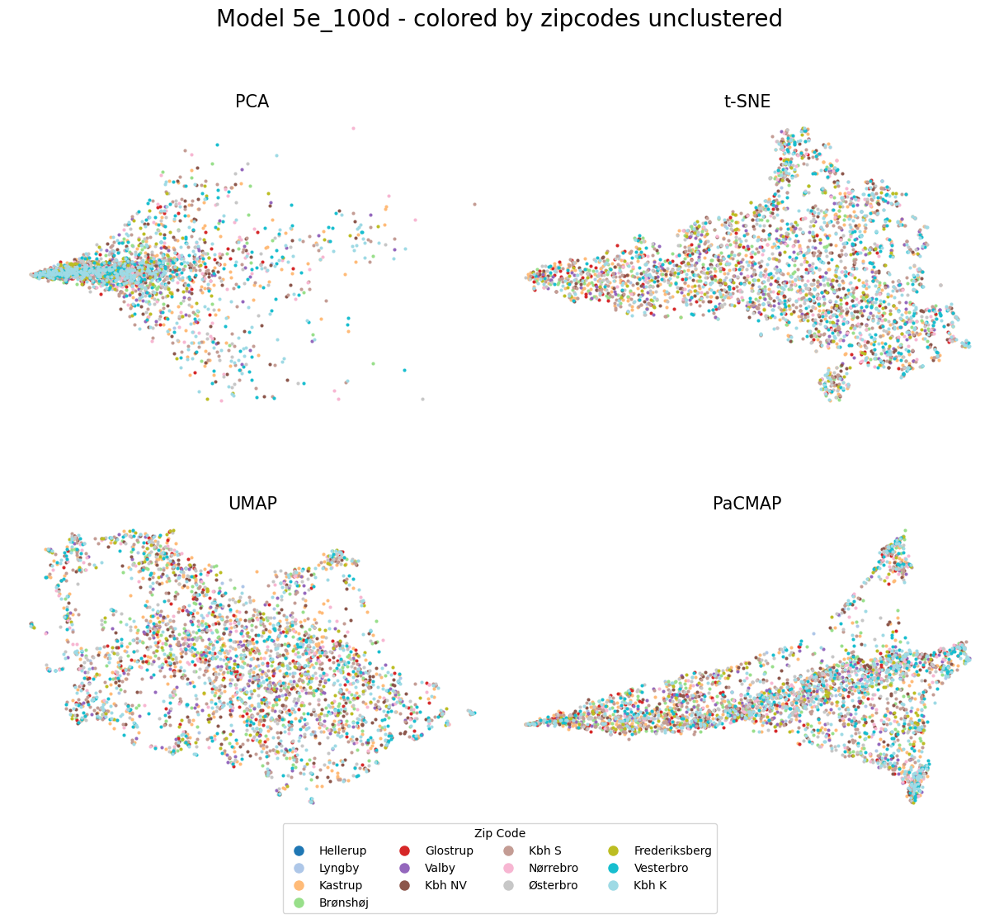

In [108]:

zip_colors = {}  # Dictionary to map zip codes to colors
unique_zip_codes = sorted(zip_to_label.keys(), reverse=True)
num_colors = len(unique_zip_codes) 
color_palette = plt.cm.get_cmap('tab20', num_colors)  # Choose a colormap

for idx, zip_code in enumerate(unique_zip_codes):
    zip_colors[zip_code] = color_palette(idx)

# Create the plots
fig, ax = plt.subplots(2, 2, figsize=(12, 10), layout='constrained', gridspec_kw={'wspace': 0.0, 'hspace': 0.2})
xs = [proj_pca, proj_tsne, proj_umap, proj_pacmap]  # Use xs to select different dimensionality reduction results
ts = ["PCA", "t-SNE", "UMAP", "PaCMAP"]
s = 0

#should be two times two
for row in ax:
    for col in row:
        #print("One plot")
        col.set_title(ts[s], fontsize=15)
        # # Filter journeys by field

        for current_zip_code in unique_zip_codes:
            # Plot all journeys for each zip code
            relevant_addresses = []
            for address, zip_code in modified_address_cluster_zips.items():
                if address in journey_ids:
                    if current_zip_code == zip_code:
                        relevant_addresses.append(address)

            relevant_journeys_zip = [journey_id for journey_id in relevant_addresses]
            col.scatter(
                [xs[s][journey_idx[journey_id]][0] for journey_id in relevant_journeys_zip],
                [xs[s][journey_idx[journey_id]][1] for journey_id in relevant_journeys_zip],
                lw=0.1, s=8, label=current_zip_code, c=zip_colors[current_zip_code]
            )
        s += 1
        col.axis('off')

# Custom legend
handles = [plt.Line2D([0], [0], marker='o', color='w', markersize=10, markerfacecolor=zip_colors[zip_code], label=zip_to_label[zip_code]) for zip_code in unique_zip_codes]
fig.legend(handles= handles, loc="outside lower center", ncol=4, title='Zip Code')
fig.suptitle('Model 5e_100d - colored by zipcodes unclustered', fontsize=20, y=1.1)
plt.show()


/var/folders/z3/0j97vknj4696wz9q6_jg32240000gn/T/ipykernel_1374/1985805477.py:4: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



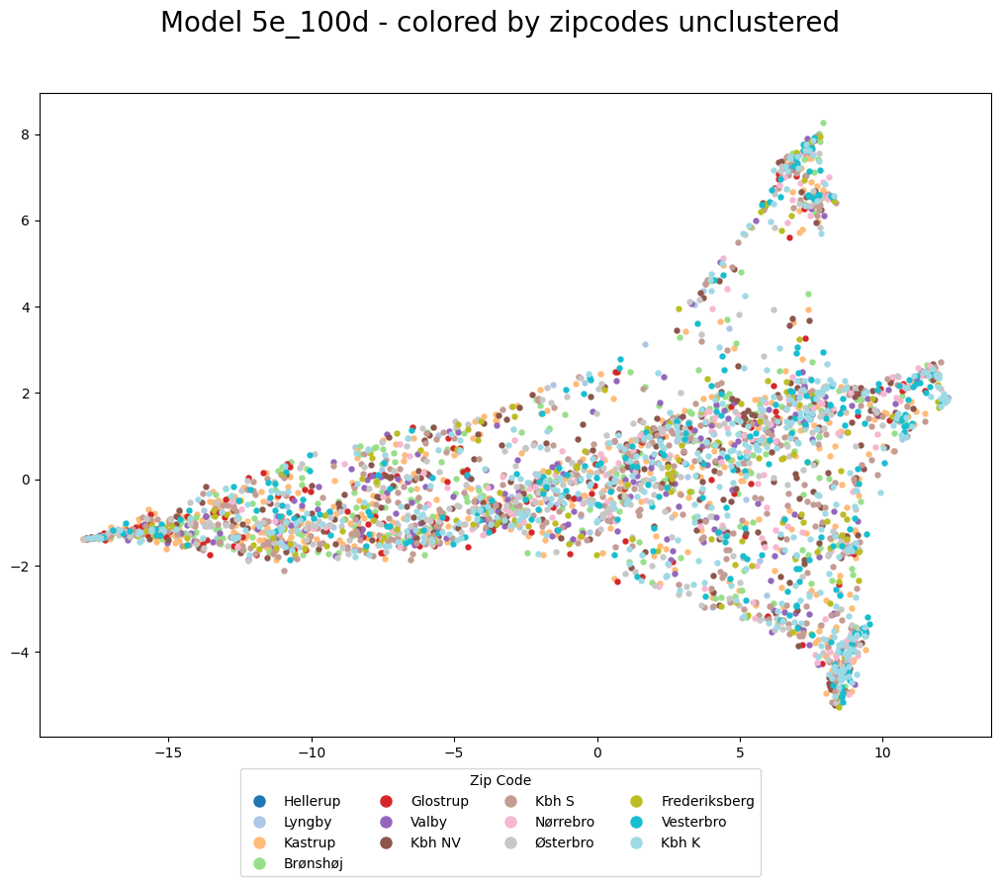

In [109]:

zip_colors = {}  # Dictionary to map zip codes to colors
unique_zip_codes = sorted(zip_to_label.keys(), reverse=True)
num_colors = len(unique_zip_codes) 
color_palette = plt.cm.get_cmap('tab20', num_colors)  # Choose a colormap

for idx, zip_code in enumerate(unique_zip_codes):
    zip_colors[zip_code] = color_palette(idx)

# Create the plots
fig, ax = plt.subplots(1, 1, figsize=(10, 8), layout='constrained', gridspec_kw={'wspace': 0.0, 'hspace': 0.2})

for current_zip_code in unique_zip_codes:
    # Plot all journeys for each zip code
    relevant_addresses = []
    for address, zip_code in modified_address_cluster_zips.items():
        if address in journey_ids:
            if current_zip_code == zip_code:
                relevant_addresses.append(address)

    relevant_journeys_zip = [journey_id for journey_id in relevant_addresses]
    plt.scatter(
        [proj_pacmap[journey_idx[journey_id]][0] for journey_id in relevant_journeys_zip],
        [proj_pacmap[journey_idx[journey_id]][1] for journey_id in relevant_journeys_zip],
        lw=0.1, s=20, label=current_zip_code, c=zip_colors[current_zip_code]
    )

# Custom legend
handles = [plt.Line2D([0], [0], marker='o', color='w', markersize=10, markerfacecolor=zip_colors[zip_code], label=zip_to_label[zip_code]) for zip_code in unique_zip_codes]
fig.legend(handles= handles, loc="outside lower center", ncol=4, title='Zip Code')
fig.suptitle('Model 5e_100d - colored by zipcodes unclustered', fontsize=20, y=1.1)
plt.show()


### More clustered

In [110]:
# New dictionary to store modified keys and their corresponding zip codes
modified_address_cluster_zips = {}

# Iterate through the keys, apply regex operation, and update the new dictionary
for address, zipcode in address_more_cluster_zips.items():
    new_address = get_modified(address)
    modified_address_cluster_zips[new_address] = zipcode


/var/folders/z3/0j97vknj4696wz9q6_jg32240000gn/T/ipykernel_1374/2470452665.py:4: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



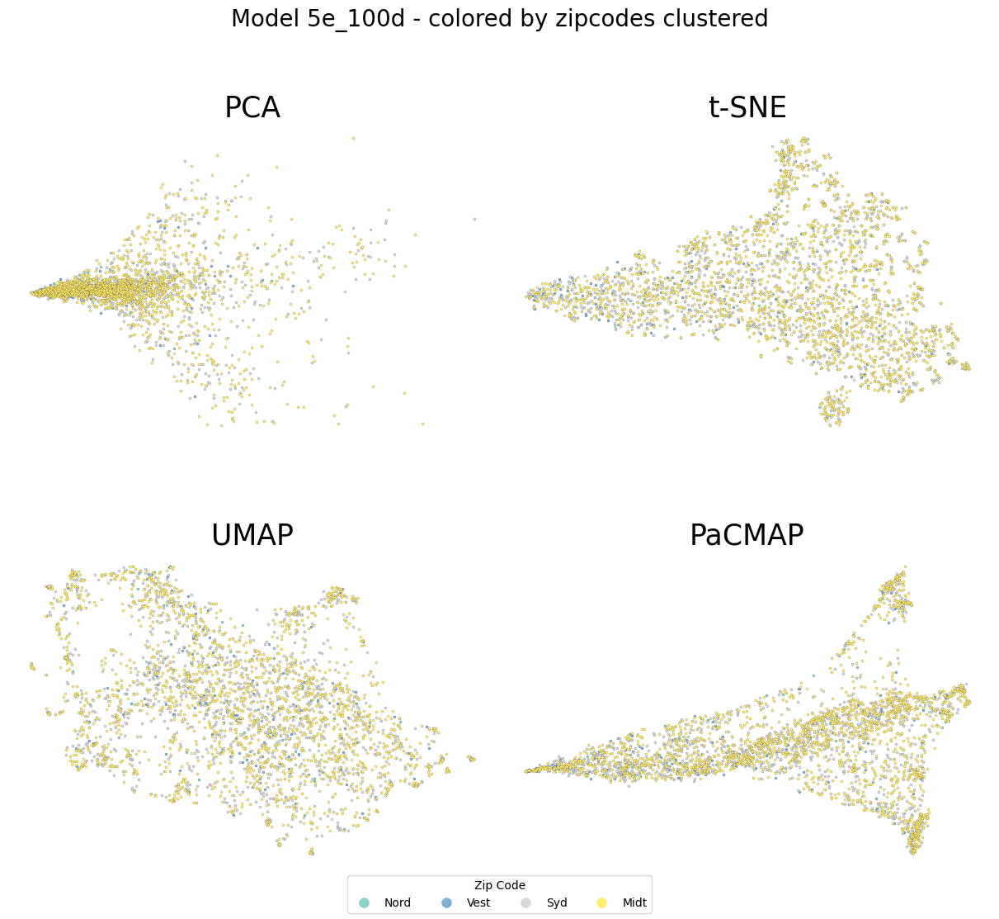

In [111]:

zip_colors = {}  # Dictionary to map zip codes to colors
unique_zip_codes = sorted(zip_to_label_clustered.keys(), reverse=True)
num_colors = len(unique_zip_codes) #change this
color_palette = plt.cm.get_cmap('Set3', num_colors)  # Choose a colormap

for idx, zip_code in enumerate(unique_zip_codes):
    zip_colors[zip_code] = color_palette(idx)

fig, ax = plt.subplots(2, 2, figsize=(12, 10), layout='constrained', gridspec_kw={'wspace': 0.0, 'hspace': 0.2})
xs = [proj_pca, proj_tsne, proj_umap, proj_pacmap]  # Use xs to select different dimensionality reduction results
ts = ["PCA", "t-SNE", "UMAP", "PaCMAP"]
s = 0

for row in ax:
    for col in row:
        col.set_title(ts[s], fontsize=25)
        for current_zip_code in unique_zip_codes:
            # Plot all journeys for each zip code
            relevant_addresses = []
            for address, zip_code in modified_address_cluster_zips.items():
                if address in journey_ids:
                    if current_zip_code == zip_code:
                        relevant_addresses.append(address)
            relevant_journeys_zip = [journey_id for journey_id in relevant_addresses]
            col.scatter(
                [xs[s][journey_idx[journey_id]][0] for journey_id in relevant_journeys_zip],
                [xs[s][journey_idx[journey_id]][1] for journey_id in relevant_journeys_zip],
                lw=0.1, s=5, label=current_zip_code, edgecolors='black',  c=zip_colors[current_zip_code]
            )

        s += 1
        col.axis('off')

# Custom legend

handles = [plt.Line2D([0], [0], marker='o', color='w', markersize=10, markerfacecolor=zip_colors[zip_code], label=zip_to_label_clustered[zip_code]) for zip_code in unique_zip_codes]
fig.legend(handles= handles, loc="outside lower center", ncol=4, title='Zip Code')
fig.suptitle('Model 5e_100d - colored by zipcodes clustered', fontsize=20, y=1.1)
plt.show()


In [112]:
Counter(modified_address_cluster_zips.values())

Counter({'1000': 2279, '2300': 1379, '2600': 312, '2800': 153})

zip:  2200
zip:  2100
zip:  1500
zip:  1000


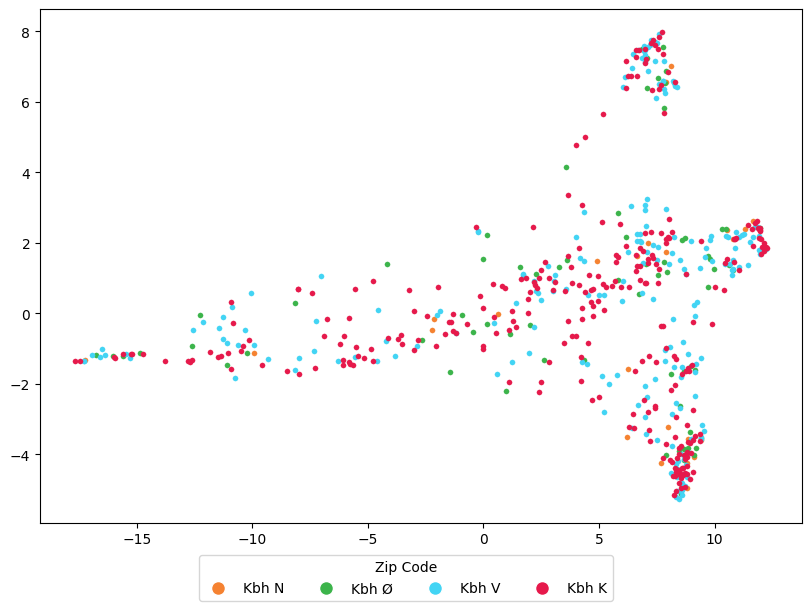

In [113]:
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd

zip_colors = {}  # Dictionary to map zip codes to colors
unique_zip_codes = sorted(zip_to_label_kbh_only.keys(), reverse=True)
num_colors = len(unique_zip_codes) #change this
color_palette = ['#f58231', '#3cb44b', '#42d4f4','#e6194b']

for idx, zip_code in enumerate(unique_zip_codes):
    zip_colors[zip_code] = color_palette[idx]

fig, ax = plt.subplots(1, 1, figsize=(8, 6), layout="constrained", gridspec_kw={'wspace': 0.0, 'hspace': 0.2})

for current_zip_code in unique_zip_codes:
            print("zip: ", current_zip_code)
            # Plot all journeys for each zip code
            relevant_addresses = []
            for address, zip_code in address_kbh_cluster_zips.items():
                if address in journey_ids:
                    if current_zip_code == zip_code:
                        relevant_addresses.append(address)
            relevant_journeys_zip = [journey_id for journey_id in relevant_addresses]
            plt.scatter(
                [proj_pacmap[journey_idx[journey_id]][0] for journey_id in relevant_journeys_zip],
                [proj_pacmap[journey_idx[journey_id]][1] for journey_id in relevant_journeys_zip],
                lw=0.1, s=15, label=current_zip_code,  c=zip_colors[current_zip_code]
            )
# Custom legend
handles = [plt.Line2D([0], [0], marker='o', color='w', markersize=10, markerfacecolor=zip_colors[zip_code], label=zip_to_label_kbh_only[zip_code]) for zip_code in unique_zip_codes]
fig.legend(handles= handles, loc="outside lower center", ncol=4, title='Zip Code')

plt.show()

#### CLUSTER KBH

In [114]:
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd

zip_colors = {}  # Dictionary to map zip codes to colors
unique_zip_codes = sorted(zip_to_label_kbh_only.keys(), reverse=True)
num_colors = len(unique_zip_codes) #change this
color_palette = ['#ffe119', '#3cb44b', '#42d4f4','#e6194b']

for idx, zip_code in enumerate(unique_zip_codes):
    zip_colors[zip_code] = color_palette[idx]


for idx, count_code in enumerate(unique_zip_codes):
    count_colors[count_code] = color_palette[idx]  # Use modulo to cycle through the color palette

# Create a Pandas DataFrame
df = pd.DataFrame(data=proj_pacmap, columns=['Dimension 1', 'Dimension 2'])
df['Station Name'] = journey_ids

df['Zip'] = df['Station Name'].map(address_kbh_cluster_zips)

# Map zip to colors
df['Color'] = df['Zip'].map(count_colors)


import plotly.graph_objects as go

# Create traces for each unique color
legend_traces = []
for zip_code, color in count_colors.items():
    # Filter DataFrame to include only rows with the current count_code
    filtered_df = df[df['Zip'] == zip_code]
    # Create a scatter trace for this color
    trace = go.Scatter(
        x=filtered_df['Dimension 1'],
        y=filtered_df['Dimension 2'],
        mode='markers',
        marker=dict(color=color),
        name=str(zip_code),  # Use count_code as legend label
        hoverinfo='text',  # Show text on hover
        text=filtered_df['Station Name'] + ' (' + filtered_df['Zip'].astype(str) + ')',  # Concatenate station name and count
    )
    legend_traces.append(trace)

# Add the scatter traces to the figure
fig = go.Figure(data=legend_traces)

# Update the layout
fig.update_layout(
    title="Zip codes for Kbh K (1000), Kbh V (1500), Kbh Ø (2100), Kbh N (2200)",
    height=800,  # Set the height of the plot (in pixels)
    legend_title_text='Zip Code',  # Add a title to the legend
    plot_bgcolor='rgba(255, 255, 255, 0.8)',  # Set plot background color to lighter one
    legend=dict(
        bordercolor='rgba(0, 0, 0, 0.5)',  # Set legend border color
        borderwidth=1  # Set legend border width
    )

)

# Show the plot
fig.show()



_____________________________________________________________________

# SIMILARITY - EMBEDDING VALIDATION

In [115]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

# Assuming X is your embeddings_matrix
embeddings_matrix = X.shape

# Calculate cosine similarity matrix between station vectors
similarity_matrix = cosine_similarity(X)

highest = -1
for i in range(similarity_matrix.shape[0]):
    for j in range(similarity_matrix.shape[1]):
        if i != j and similarity_matrix[i, j] > highest:
            highest = similarity_matrix[i, j]

print(highest)

# Find the indices of the maximum similarity score in the updated matrix
max_indices = np.argwhere(similarity_matrix == highest)

# Extract the indices of the most similar pair
most_similar_pair_indices = max_indices[0]

# Get the station names corresponding to the indices
station_names = model.wv.index_to_key
station_i_name = station_names[most_similar_pair_indices[0]]
station_j_name = station_names[most_similar_pair_indices[1]]

# Print the names of the two most similar stations
print(f"The two most similar stations (not the same) are: {station_i_name} and {station_j_name}")

# # X is your numpy array containing the embedding vectors. Each row of X represents a vector in the embedding space.
# # cosine_similarity(X) computes the cosine similarity between all pairs of vectors in X.
# # The resulting similarity_matrix is a symmetric matrix where each element similarity_matrix[i, j] represents the cosine similarity between vectors X[i] and X[j].
# # After calculating the cosine similarity matrix, you can proceed to perform clustering or any other analysis based on the similarity values.

0.9905597
The two most similar stations (not the same) are: Køge St. and Thorupgård Allé


### København H validation on cosine embedding

In [116]:
list_lbh_sim = model.wv.similar_by_key('København H', topn=4000)

kbh_to_sim = {"København H": 1.0}
for location, sim in list_lbh_sim:
    kbh_to_sim[location] = sim

kbh_to_sim

{'København H': 1.0,
 'Axeltorv': 0.7438591718673706,
 'Banegårdspladsen': 0.7147773504257202,
 'Tietgensgade': 0.7139832377433777,
 'Vestergade': 0.6945743560791016,
 'Bernstorffsgade': 0.6939112544059753,
 'Vester Voldgade': 0.6863526701927185,
 'DGI Byen': 0.683293879032135,
 'Hammerichsgade': 0.6667801737785339,
 'Istedgade': 0.658430814743042,
 'Halmtorvet': 0.6516885757446289,
 'Reventlowsgade': 0.6504085659980774,
 'Trommesalen': 0.6448825001716614,
 'Vodroffs Tværgade': 0.6420493125915527,
 'Østergade': 0.6205928921699524,
 'Nygade': 0.6191301345825195,
 'København H (Metro)': 0.6124704480171204,
 'Gammeltorv': 0.6101997494697571,
 'Rådhusstræde': 0.6089519262313843,
 'Frederiksberggade': 0.6081905364990234,
 'Knabrostræde': 0.6081708669662476,
 'Krystalgade': 0.6062605381011963,
 'Niels Ebbesens Vej': 0.6061654686927795,
 'Ingerslevsgade': 0.6023964285850525,
 'Studiestræde': 0.6016766428947449,
 'Nørre Søgade': 0.5978189706802368,
 'Maltagade': 0.5945670008659363,
 'Sankt Jør

low Den Ukrainske Ambassade    0.01666565053164959
high København H    1.0


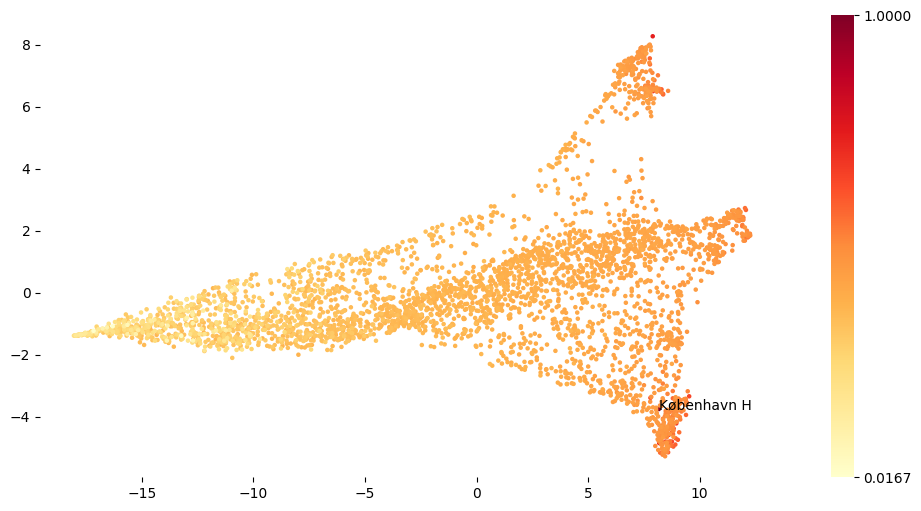

In [210]:

station_names = kbh_to_sim.keys()
# Get the first element
low_key, low_value = list(kbh_to_sim.items())[-1]
high_key, high_value = next(iter(kbh_to_sim.items()))

print("low", low_key, "  ", low_value)
print("high", high_key, "  ", high_value)
norm = Normalize(vmin=low_value, vmax=high_value)
fig, ax = plt.subplots(1, 1, figsize=(12, 6))

grayscale_values = [(kbh_to_sim[station]) for station in station_names]
# Plot the stations using paCMAP with grayscale colors
scatter = plt.scatter(proj_pacmap[:, 0], proj_pacmap[:, 1], c=grayscale_values, cmap='YlOrRd', s=5, alpha=1.0)

# Set the colorbar
colorbar = plt.colorbar(scatter, ax=ax)

# Manually set colorbar ticks and labels
colorbar.set_ticks([high_value, low_value])  # Adjust these as needed based on your scale

kbh_idx = journey_idx['København H']
#ADD LABEL TO JUST KØBENHAVN H
plt.text(proj_pacmap[kbh_idx, 0], proj_pacmap[kbh_idx, 1], 'København H', fontsize=10, ha='left')

# Remove the black border
ax.spines['top'].set_color('none')
ax.spines['bottom'].set_color('none')
ax.spines['left'].set_color('none')
ax.spines['right'].set_color('none')

# Remove the border around the color bar
colorbar.outline.set_visible(False)

#plt.title('paCMAP Plot with Similarity to Kbh H')
plt.show()


### Rued Langgaards Vej validation on cosine embedding

In [118]:
list_rued_sim = model.wv.similar_by_key('Rued Langgaards Vej', topn=4000)

rued_to_sim = {"Rued Langgaards Vej": 1.0}
for location, sim in list_rued_sim:
    rued_to_sim[location] = sim

rued_to_sim

{'Rued Langgaards Vej': 1.0,
 'Krokodillegade': 0.941950261592865,
 'Gunløgsgade': 0.929219663143158,
 'Smørumvej': 0.9236794114112854,
 'Dæmningen': 0.9234192967414856,
 'Vennemindevej': 0.9221628308296204,
 'Fælledparken Skatepark': 0.9207092523574829,
 'Mosesvinget': 0.9200780391693115,
 'Det Nye Emdrupborg Kollegium': 0.9198076128959656,
 'Dyssegårdsvej': 0.918389618396759,
 'Adolph Steens Alle': 0.9172426462173462,
 'Bispebjerg Parkallé': 0.9136267304420471,
 'Mosevangen': 0.9121113419532776,
 'Druehaven': 0.911362886428833,
 'Gustav Johannsens Vej': 0.9113001823425293,
 'Skyttegårdvej': 0.9112046957015991,
 'Charlotte Muncks Vej': 0.9107897877693176,
 'Kagsbro': 0.9102784395217896,
 'Plantevej': 0.9101508259773254,
 'Junggreensvej': 0.9092990756034851,
 'Rigensgade': 0.9092826247215271,
 'Ole Maaløes Vej': 0.9078429937362671,
 'Kærskiftevej': 0.9077015519142151,
 'Heinesgade': 0.9075583815574646,
 'Adriansvej': 0.9074336290359497,
 'Sankt Markus Plads': 0.9061188101768494,
 'Valb

low Rued Langgaards Vej    1.0
high Den Ukrainske Ambassade    0.06156621500849724


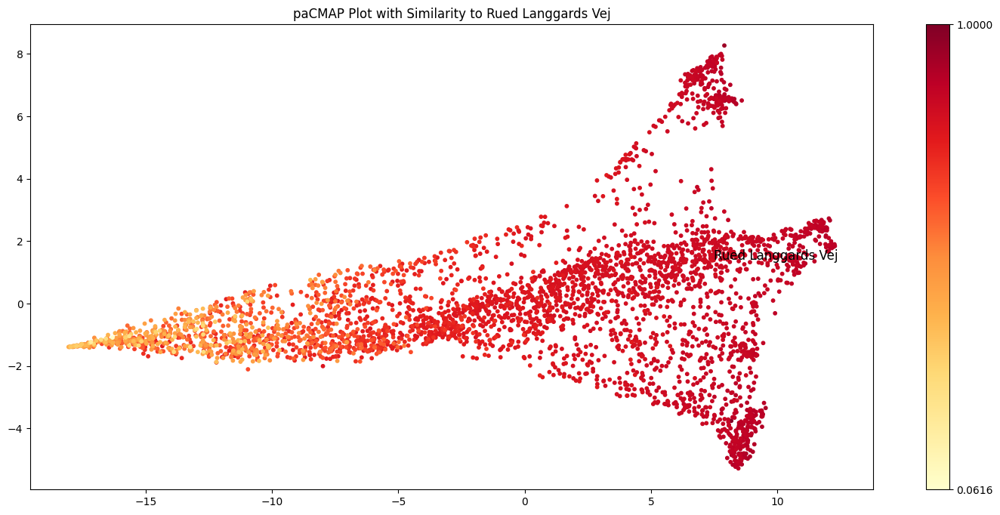

In [119]:

station_names = rued_to_sim.keys()
# Get the first element
low_key, low_value = next(iter(rued_to_sim.items()))
high_key, high_value = list(rued_to_sim.items())[-1]

print("low", low_key, "  ", low_value)
print("high", high_key, "  ", high_value)
norm = Normalize(vmin=low_value, vmax=high_value)
fig, ax = plt.subplots(1, 1, figsize=(18, 8))

grayscale_values = [(rued_to_sim[station]) for station in station_names]
# Plot the stations using paCMAP with grayscale colors
scatter = plt.scatter(proj_pacmap[:, 0], proj_pacmap[:, 1], c=grayscale_values, cmap='YlOrRd', s=10, alpha=1.0)

# Set the colorbar
colorbar = plt.colorbar(scatter, ax=ax)

# Manually set colorbar ticks and labels
colorbar.set_ticks([high_value, low_value])  # Adjust these as needed based on your scale


rued_idx = journey_idx['Rued Langgaards Vej']
#ADD LABEL TO JUST RUED LANGGAARDS VEJ
plt.text(proj_pacmap[rued_idx, 0], proj_pacmap[rued_idx, 1], 'Rued Langgards Vej', fontsize=12, ha='left')

plt.title('paCMAP Plot with Similarity to Rued Langgards Vej')
plt.show()


### Æblehaven validation on cosine embedding

In [120]:
list_æble_sim = model.wv.similar_by_key('Æblehaven', topn=5000)

æble_to_sim = {"Æblehaven": 1.0}
for location, sim in list_æble_sim:
    æble_to_sim[location] = sim


# Write the results to a file
with open("æble_similar_words.txt", "w", encoding="utf-8") as file:
    for location, sim in æble_to_sim.items():
        file.write(f"{location}: {sim}\n")

æble_to_sim


{'Æblehaven': 1.0,
 'Martin Luther Kings Vej': 0.9464658498764038,
 'V.A. Borgens Vej': 0.9420552253723145,
 'Marguerite Vibys Plads': 0.9386144876480103,
 'Skoubogade': 0.9379590153694153,
 'Støbegodsvej': 0.9366241693496704,
 'Nobis Hotel': 0.9366217851638794,
 'Lauravej': 0.9359109997749329,
 'Lykkesholms Allé': 0.9359049797058105,
 'Prins Constantins Vej': 0.9356565475463867,
 'Vor Frelsers Kirke': 0.9331955313682556,
 'Ved Kanalen': 0.9329544305801392,
 'Langøgade': 0.9327868223190308,
 'Vestbanevej': 0.9324917197227478,
 'Kulturhuset Indre By': 0.932479739189148,
 'Bratskovvej': 0.9310116767883301,
 'Krügersgade': 0.9308428168296814,
 'Priorvej': 0.9302312731742859,
 'Allersgade': 0.9299588799476624,
 'Kvæsthusbroen': 0.9293764233589172,
 'Hothers Plads': 0.9290462732315063,
 'Grundtvigsvej': 0.9289167523384094,
 'Brysselgade': 0.9286782145500183,
 'Nærumgade': 0.9283057451248169,
 'Gartnerivej': 0.9276339411735535,
 'Tivolislottet': 0.9263295531272888,
 'Lindebugten': 0.92617779

low Den Ukrainske Ambassade    0.10392951965332031
high Æblehaven    1.0


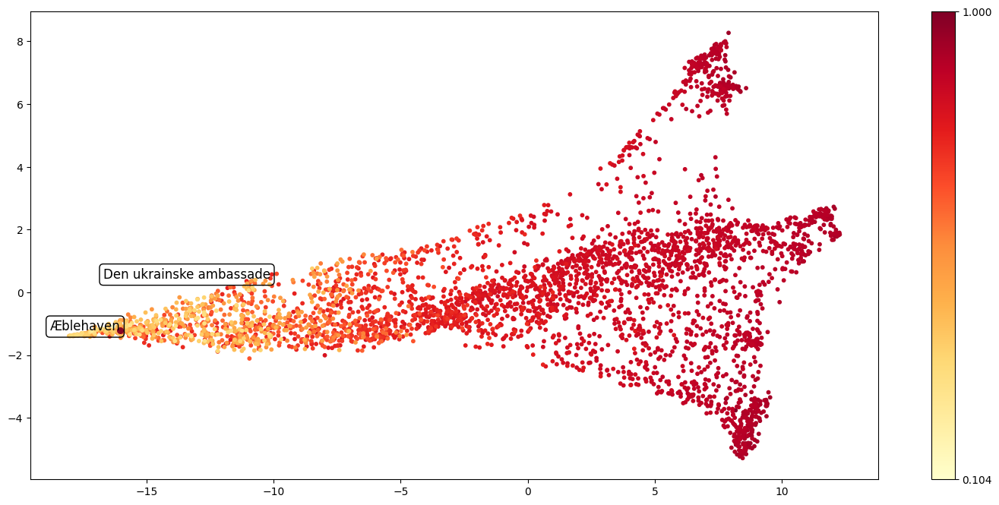

In [121]:

station_names = æble_to_sim.keys()
# Get the first element
low_key, low_value = list(æble_to_sim.items())[-1]
high_key, high_value = next(iter(æble_to_sim.items()))

print("low", low_key, "  ", low_value)
print("high", high_key, "  ", high_value)
norm = Normalize(vmin=low_value, vmax=high_value)
fig, ax = plt.subplots(1, 1, figsize=(18, 8))

grayscale_values = [(æble_to_sim[station]) for station in station_names]
scatter = plt.scatter(proj_pacmap[:, 0], proj_pacmap[:, 1], c=grayscale_values, cmap='YlOrRd', s=10, alpha=1.0)

# Set the colorbar
colorbar = plt.colorbar(scatter, ax=ax)

# Manually set colorbar ticks and labels
colorbar.set_ticks([high_value, low_value])  # Adjust these as needed based on your scale

æble_idx = journey_idx['Æblehaven']
ukraine_idx = journey_idx['Den Ukrainske Ambassade']
#ADD LABEL TO JUST RUED LANGGAARDS VEJ
scatter_æble= plt.scatter(proj_pacmap[æble_idx, 0], proj_pacmap[æble_idx, 1], c='#880424', s=30, alpha=1.0)
plt.text(proj_pacmap[æble_idx, 0], proj_pacmap[æble_idx, 1], 'Æblehaven', fontsize=12, ha='right', bbox=dict(boxstyle="round", ec='black',fc='none'))
plt.text(proj_pacmap[ukraine_idx, 0], proj_pacmap[ukraine_idx, 1], 'Den ukrainske ambassade', fontsize=12, ha='right', bbox=dict(boxstyle="round", ec='black',fc='none'))

#plt.title('p')
plt.show()


__________________________________________________________________________________________________________________________________________________________

# CHOOSING MODEL AND DIMENSIONS


In [122]:
model_10000_100=word2vec.Word2Vec.load('../Data/Models/model_10000e_100d.model')
model_10000_100_lowest=word2vec.Word2Vec.load('../Data/Models/model_10000e_100d_lowest_loss.model')
model_2000_300=word2vec.Word2Vec.load('../Data/Models/best_model_new.model') 
model_2000_100=word2vec.Word2Vec.load('../Data/Models/model_5325_locations_2000e.model')
model_50_300=word2vec.Word2Vec.load('../Data/Models/model_5325_locations_50e_300d.model')
model_50_100=word2vec.Word2Vec.load('../Data/Models/model_5325_locations_50e_100d.model')
model_10_100= word2vec.Word2Vec.load('../Data/Models/model_10e_100d.model')
model_5_100= word2vec.Word2Vec.load('../Data/Models/model_5e_100d.model')
model_2_100= word2vec.Word2Vec.load('../Data/Models/model_2e_100d.model')
model_1_100= word2vec.Word2Vec.load('../Data/Models/model_1e_100d.model')

Plotting all models with paCMAP

In [123]:
X = model_10000_100.wv.vectors
embedding_10000_100 = pacmap.PaCMAP(n_components=2, n_neighbors=20, MN_ratio=0.5, FP_ratio=2.0) 
proj_10000_100 = embedding_10000_100.fit_transform(X, init="pca")

X1 = model_10000_100_lowest.wv.vectors
embedding_10000_100_lowest = pacmap.PaCMAP(n_components=2, n_neighbors=20, MN_ratio=0.5, FP_ratio=2.0) 
proj_10000_100_lowest = embedding_10000_100_lowest.fit_transform(X1, init="pca")

X2 = model_2000_300.wv.vectors
embedding_2000_300 = pacmap.PaCMAP(n_components=2, n_neighbors=20, MN_ratio=0.5, FP_ratio=2.0) 
proj_2000_300 = embedding_2000_300.fit_transform(X2, init="pca")

X3 = model_2000_100.wv.vectors
embedding_2000_100 = pacmap.PaCMAP(n_components=2, n_neighbors=20, MN_ratio=0.5, FP_ratio=2.0) 
proj_2000_100 = embedding_2000_100.fit_transform(X3, init="pca")

X4 = model_50_300.wv.vectors
embedding_50_300 = pacmap.PaCMAP(n_components=2, n_neighbors=20, MN_ratio=0.5, FP_ratio=2.0) 
proj_50_300 = embedding_50_300.fit_transform(X4, init="pca")

X5 = model_50_100.wv.vectors
embedding_50_100 = pacmap.PaCMAP(n_components=2, n_neighbors=20, MN_ratio=0.5, FP_ratio=2.0) 
proj_50_100 = embedding_50_100.fit_transform(X5, init="pca")

X6 = model_10_100.wv.vectors
embedding_10_100 = pacmap.PaCMAP(n_components=2, n_neighbors=20, MN_ratio=0.5, FP_ratio=2.0) 
proj_10_100 = embedding_10_100.fit_transform(X6, init="pca")

X7 = model_5_100.wv.vectors
embedding_5_100 = pacmap.PaCMAP(n_components=2, n_neighbors=20, MN_ratio=0.5, FP_ratio=2.0) 
proj_5_100 = embedding_5_100.fit_transform(X7, init="pca")

X8 = model_2_100.wv.vectors
embedding_2_100 = pacmap.PaCMAP(n_components=2, n_neighbors=20, MN_ratio=0.5, FP_ratio=2.0) 
proj_2_100 = embedding_2_100.fit_transform(X8, init="pca")

X9 = model_1_100.wv.vectors
embedding_1_100 = pacmap.PaCMAP(n_components=2, n_neighbors=20, MN_ratio=0.5, FP_ratio=2.0) 
proj_1_100 = embedding_1_100.fit_transform(X9, init="pca")


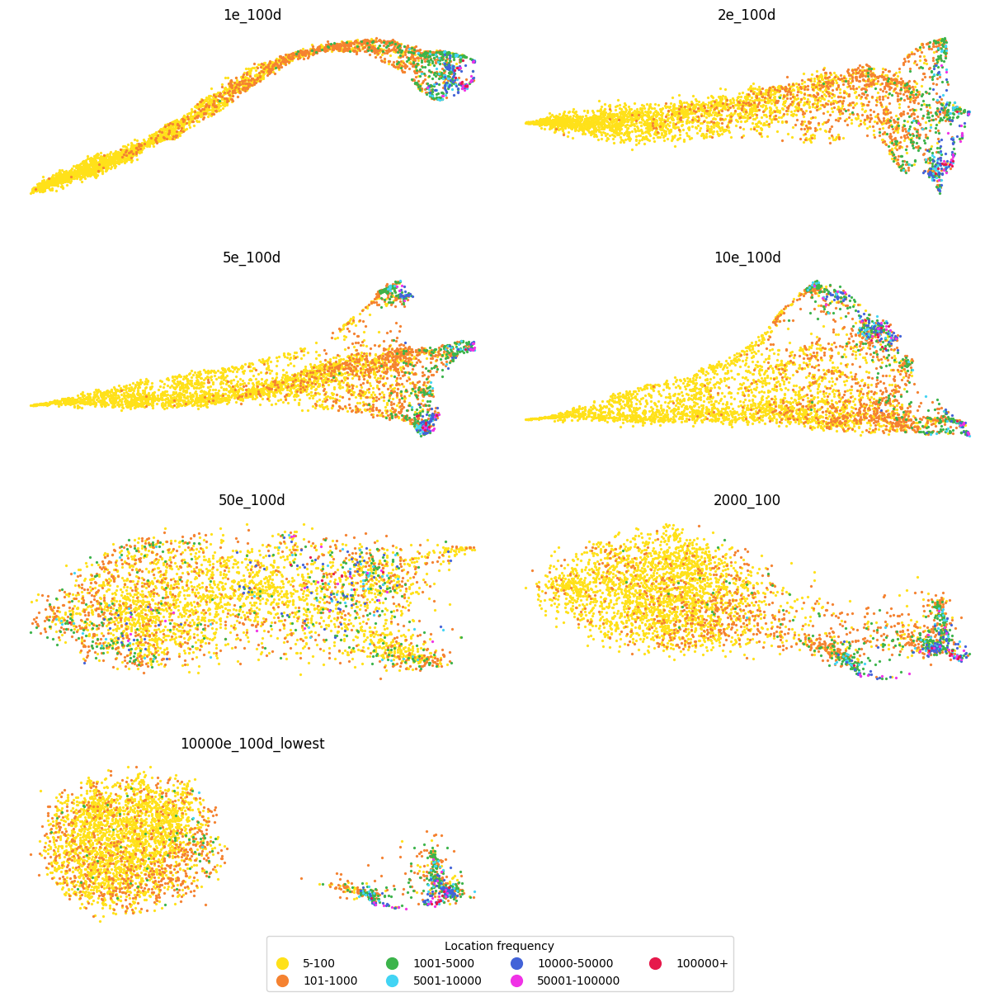

In [124]:
# Define color palette for zip codes
count_colors = {}  # Dictionary to map zip codes to colors
unique_count_codes = sorted(counts_to_labels.keys())
num_colors = len(unique_count_codes) #change this
#color_palette = plt.cm.get_cmap('tab20', num_colors)  # Choose a colormap
color_palette = ['#ffe119', '#f58231', '#3cb44b', '#42d4f4', '#4363d8', '#f032e6', '#e6194b']
#print("number of unique zips: ", num_colors)

for idx, count_code in enumerate(unique_count_codes):
    count_colors[count_code] = color_palette[idx]

# Create the plots
fig, ax = plt.subplots(4, 2, figsize=(12, 12), layout='constrained', gridspec_kw={'wspace': 0.0, 'hspace': 0.2})
xs = [proj_1_100, proj_2_100, proj_5_100, proj_10_100, proj_50_100, proj_2000_100, proj_10000_100_lowest]  # Use xs to select different dimensionality reduction results
ts = ["1e_100d", "2e_100d", "5e_100d","10e_100d", "50e_100d", "2000_100", "10000e_100d_lowest"]
s = 0
fig.delaxes(ax[3, 1])

for row in ax:
    for col in row:
        try:
            col.set_title(ts[s], fontsize=12, pad=10)
            for current_count_code in unique_count_codes:
                relevant_addresses = []
                for address, count_code in address_cluster_count.items():
                    if address in journey_ids:
                        if current_count_code == count_code:
                            relevant_addresses.append(address)

                relevant_journeys_count = [journey_id for journey_id in relevant_addresses]
                col.scatter(
                    [xs[s][journey_idx[journey_id]][0] for journey_id in relevant_journeys_count],
                    [xs[s][journey_idx[journey_id]][1] for journey_id in relevant_journeys_count],
                    lw=0.1, s=5, label=current_count_code, c=count_colors[current_count_code]
                )
            #  # Add labels to stations makes it impossible to read 
            #     for journey_id in relevant_journeys_zip:
            #         x_coord = xs[s][journey_idx[journey_id]][0]
            #         y_coord = xs[s][journey_idx[journey_id]][1]
            #         col.text(x_coord, y_coord, journey_id, fontsize=8)  # Adjust fontsize as needed
                
            s += 1
            col.axis('off')
        except IndexError:
            continue


# Custom legend
handles = [plt.Line2D([0], [0], marker='o', color='w', markersize=12, markerfacecolor=count_colors[count_code], label=counts_to_labels[count_code]) for count_code in unique_count_codes]
fig.legend(handles= handles, loc="outside lower center", ncol=4, title='Location frequency' )
#fig.suptitle('All models: paCMAP', fontsize=30, y=1.1)
plt.show()


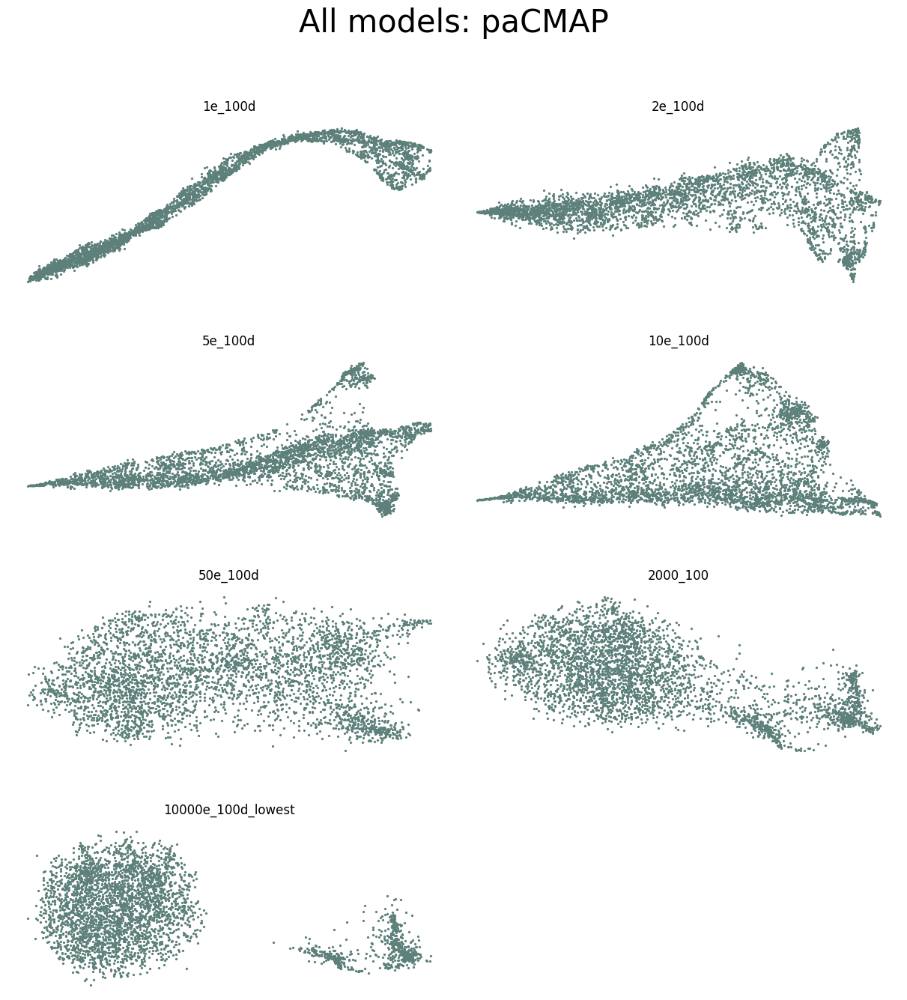

In [125]:
# Define color palette for zip codes
count_colors = {}  # Dictionary to map zip codes to colors
unique_count_codes = sorted(counts_to_labels.keys())
num_colors = len(unique_count_codes) #change this
#color_palette = plt.cm.get_cmap('tab20', num_colors)  # Choose a colormap
color_palette = ['#ffe119', '#f58231', '#3cb44b', '#42d4f4', '#4363d8', '#f032e6', '#e6194b']
#print("number of unique zips: ", num_colors)

for idx, count_code in enumerate(unique_count_codes):
    count_colors[count_code] = color_palette[idx]

# Create the plots
fig, ax = plt.subplots(4, 2, figsize=(12, 12), layout='constrained', gridspec_kw={'wspace': 0.0, 'hspace': 0.2})
xs = [proj_1_100, proj_2_100, proj_5_100, proj_10_100, proj_50_100, proj_2000_100, proj_10000_100_lowest]  # Use xs to select different dimensionality reduction results
ts = ["1e_100d", "2e_100d", "5e_100d","10e_100d", "50e_100d", "2000_100", "10000e_100d_lowest"]
s = 0
fig.delaxes(ax[3, 1])

for row in ax:
    for col in row:
        try:
            col.set_title(ts[s], fontsize=12, pad=10)
            col.scatter(
                [xs[s][journey_idx[journey_id]][0] for journey_id in journey_ids],
                [xs[s][journey_idx[journey_id]][1] for journey_id in journey_ids],
                lw=0.1, s=5, label=current_count_code, c='#5D807B'
            )
            s += 1
            col.axis('off')
        except IndexError:
            continue


# Custom legend
handles = [plt.Line2D([0], [0], marker='o', color='w', markersize=12, markerfacecolor=count_colors[count_code], label=counts_to_labels[count_code]) for count_code in unique_count_codes]
fig.suptitle('All models: paCMAP', fontsize=30, y=1.1)
plt.show()


# PARAMS NEIGHBORS

In [126]:
X10 = model.wv.vectors
embedding_x10 = pacmap.PaCMAP(n_components=2, n_neighbors=5, MN_ratio=0.5, FP_ratio=2.0) 
proj_n_5 = embedding_x10.fit_transform(X10, init="pca")

X11 = model.wv.vectors
embedding_x11 = pacmap.PaCMAP(n_components=2, n_neighbors=10, MN_ratio=0.5, FP_ratio=2.0) 
proj_n_10 = embedding_x11.fit_transform(X11, init="pca")

X12 = model.wv.vectors
embedding_x12 = pacmap.PaCMAP(n_components=2, n_neighbors=15, MN_ratio=0.5, FP_ratio=2.0) 
proj_n_15 = embedding_x12.fit_transform(X12, init="pca")

X13 = model.wv.vectors
embedding_x13 = pacmap.PaCMAP(n_components=2, n_neighbors=20, MN_ratio=0.5, FP_ratio=2.0) 
proj_n_20 = embedding_x13.fit_transform(X13, init="pca")

X14 = model.wv.vectors
embedding_x14 = pacmap.PaCMAP(n_components=2, n_neighbors=30, MN_ratio=0.5, FP_ratio=2.0) 
proj_n_30 = embedding_x14.fit_transform(X14, init="pca")

X15 = model.wv.vectors
embedding_x15 = pacmap.PaCMAP(n_components=2, n_neighbors=40, MN_ratio=0.5, FP_ratio=2.0) 
proj_n_40 = embedding_x15.fit_transform(X15, init="pca")


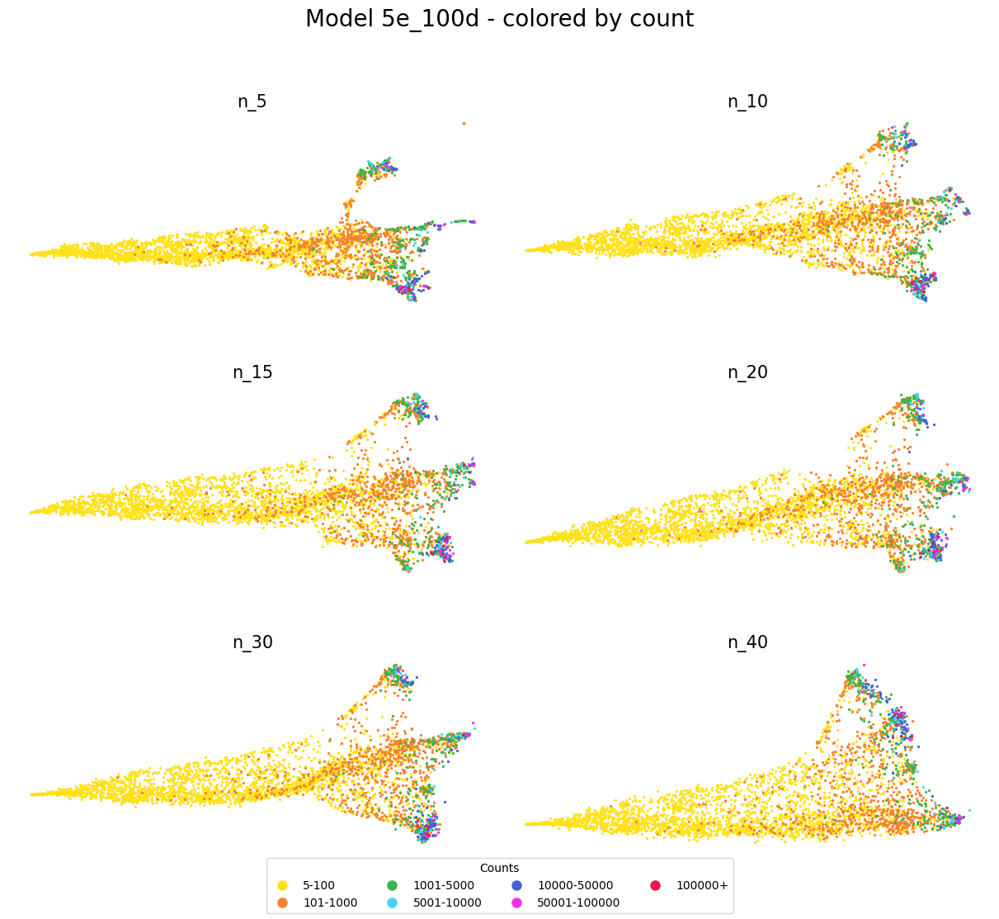

In [127]:

# Define color palette for zip codes
count_colors = {}  # Dictionary to map zip codes to colors
unique_count_codes = sorted(counts_to_labels.keys())
num_colors = len(unique_count_codes) #change this
color_palette = ['#ffe119', '#f58231', '#3cb44b', '#42d4f4', '#4363d8', '#f032e6', '#e6194b']

for idx, count_code in enumerate(unique_count_codes):
    count_colors[count_code] = color_palette[idx]

fig, ax = plt.subplots(3, 2, figsize=(12, 10), layout="constrained", gridspec_kw={'wspace': 0.0, 'hspace': 0.2})
xs = [proj_n_5, proj_n_10, proj_n_15, proj_n_20, proj_n_30, proj_n_40]  # Use xs to select different dimensionality reduction results
ts = ["n_5", "n_10", "n_15", "n_20", "n_30", "n_40"]
s = 0

for row in ax:
    for col in row:
        col.set_title(ts[s], fontsize=15)

        for current_count_code in unique_count_codes:
            relevant_addresses = []
            for address, count_code in address_cluster_count.items():
                if address in journey_ids:
                    if current_count_code == count_code:
                        relevant_addresses.append(address)

            relevant_journeys_zip = [journey_id for journey_id in relevant_addresses]
            col.scatter(
                [xs[s][journey_idx[journey_id]][0] for journey_id in relevant_journeys_zip],
                [xs[s][journey_idx[journey_id]][1] for journey_id in relevant_journeys_zip],
                lw=0.1, s=5, label=current_count_code, c=count_colors[current_count_code]
            )  
        s += 1
        col.axis('off')

# Custom legend
handles = [plt.Line2D([0], [0], marker='o', color='w', markersize=10, markerfacecolor=count_colors[count_code], label=counts_to_labels[count_code]) for count_code in unique_count_codes]
fig.legend(handles= handles, loc="outside lower center", ncol=4, title='Counts')
fig.suptitle('Model 5e_100d - colored by count', fontsize=20, y=1.1)
plt.show()


# WHAT ARE THE 3 CHICKENTOES?

In [181]:
import plotly.express as px
import pandas as pd

# Create a Pandas DataFrame
df = pd.DataFrame(data=proj_pacmap, columns=['Dimension 1', 'Dimension 2'])
df['Station Name'] = journey_ids

# Create the scatter plot using Plotly Express and color by count
fig = px.scatter(df, x='Dimension 1', y='Dimension 2', color='Station Name', 
                 hover_data={'Station Name': True},
                 color_discrete_map=count_colors)  # Use the color palette

# Customize the size of the points
fig.update_traces(marker=dict(size=5, opacity=1.0), selector=dict(mode='markers'))

# Update the layout if needed
fig.update_layout(
    title="PaCMAP Visualization",
    xaxis_title="Dimension 1",
    yaxis_title="Dimension 2",
    height=800  # Set the height of the plot (in pixels)
)

# Show the plot
fig.show()


### CLUSTERS FROM SIMILARITY? PROBABLY NOT

In [193]:
import plotly.express as px
import pandas as pd
import math

# Create a Pandas DataFrame
df = pd.DataFrame(data=proj_pacmap, columns=['Dimension 1', 'Dimension 2'])
df['Station Name'] = journey_ids

#add colors to all stations based on there similiarity to kbh
df['Sim'] = df['Station Name'].map(æble_to_sim)

# Create the scatter plot using Plotly Express and color by sim
fig = px.scatter(df, x='Dimension 1', y='Dimension 2', color='Sim', 
                 hover_data={'Station Name': True}, color_continuous_scale='YlOrRd')  # Use the color palette

# Customize the size of the points
fig.update_traces(marker=dict(size=5, opacity=1.0), selector=dict(mode='markers'))

# Add annotation for 'Æblehaven'
æblehaven_row = df[df['Station Name'] == 'Æblehaven']
fig.add_annotation(x=æblehaven_row['Dimension 1'].values[0], 
                    y=æblehaven_row['Dimension 2'].values[0],
                    text='Æblehaven', showarrow=True,
                    arrowhead=4, ax=0, ay=-40)
print(low_value)
print(high_value)
# Update the layout if needed
fig.update_layout(
    height=600,  # Set the height of the plot (in pixels)
    plot_bgcolor='rgba(255, 255, 255, 0.8)',  # Set plot background color to lighter one

    coloraxis_colorbar=dict(
        title="",
        tickvals=[low_value, 1.0000],  # Custom tick values
        ticktext=[low_value, 1.0000],  # Custom tick labels
    ),
    xaxis=dict(title=''),  # Remove x-axis label
    yaxis=dict(title='')   # Remove y-axis label
)


# Show the plot
fig.show()


0.10392951965332031
1.0


In [197]:
import plotly.express as px
import pandas as pd
import math

# Assuming kbh_to_sim is a dictionary mapping station names to similarity values

# Create a Pandas DataFrame
df = pd.DataFrame(data=proj_pacmap, columns=['Dimension 1', 'Dimension 2'])
df['Station Name'] = journey_ids

# Add colors to all stations based on their similarity to København H
df['Sim'] = df['Station Name'].map(kbh_to_sim)

# Min-Max normalization
min_sim = df['Sim'].min()
max_sim = df['Sim'].max()
df['Normalized Sim'] = (df['Sim'] - min_sim) / (max_sim - min_sim)

# Create the scatter plot using Plotly Express and color by normalized similarity
fig = px.scatter(df, x='Dimension 1', y='Dimension 2', color='Normalized Sim', 
                 hover_data={'Station Name': True}, color_continuous_scale='YlOrRd')  # Use the color palette

# Customize the size of the points
fig.update_traces(marker=dict(size=8, opacity=1.0), selector=dict(mode='markers'))

# Add annotation for 'København H'
kbh_row = df[df['Station Name'] == 'København H']
fig.add_annotation(x=kbh_row['Dimension 1'].values[0], 
                    y=kbh_row['Dimension 2'].values[0],
                    text='København H', showarrow=True,
                    arrowhead=4, ax=0, ay=-40)

# Update the layout if needed
fig.update_layout(
    height=600,  # Set the height of the plot (in pixels)
    plot_bgcolor='rgba(255, 255, 255, 0.8)',  # Set plot background color to lighter one

    coloraxis_colorbar=dict(
        title="",
        tickvals=[0, 1],  # Custom tick values
        ticktext=[min_sim, max_sim],  # Custom tick labels
    ),
    xaxis=dict(title=''),  # Remove x-axis label
    yaxis=dict(title='')   # Remove y-axis label
)

# Show the plot
fig.show()


### CLUSTERS FROM COUNT? MIGHT BE

In [131]:
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd

# Define color palette for zip codes
count_colors = {}  # Dictionary to map zip codes to colors
unique_count_codes = sorted(counts_to_labels.keys())
print(unique_count_codes)
num_colors = len(unique_count_codes)
color_palette = ['#ffe119', '#f58231', '#3cb44b', '#42d4f4', '#4363d8', '#f032e6', '#e6194b']
#color_palette = ['gold', 'tomato', 'limegreen', 'deepskyblue', 'royalblue', 'orchid', 'crimson']

for idx, count_code in enumerate(unique_count_codes):
    count_colors[count_code] = color_palette[idx]  # Use modulo to cycle through the color palette

# Create a Pandas DataFrame
df = pd.DataFrame(data=proj_pacmap, columns=['Dimension 1', 'Dimension 2'])
df['Station Name'] = journey_ids

# Map addresses to counts
address_counts = {address: address_cluster_count[address] for address in journey_ids}
df['Count'] = df['Station Name'].map(address_counts)

# Map counts to colors
df['Color'] = df['Count'].map(count_colors)
# Create traces for each unique color

import plotly.graph_objects as go

# Create traces for each unique color
legend_traces = []
for count_code, color in count_colors.items():
    # Filter DataFrame to include only rows with the current count_code
    filtered_df = df[df['Count'] == count_code]
    # Create a scatter trace for this color
    trace = go.Scatter(
        x=filtered_df['Dimension 1'],
        y=filtered_df['Dimension 2'],
        mode='markers',
        marker=dict(color=color),
        name=str(count_code),  # Use count_code as legend label
        hoverinfo='text',  # Show text on hover
        text=filtered_df['Station Name'] + ' (' + filtered_df['Count'].astype(str) + ')',  # Concatenate station name and count
    )
    legend_traces.append(trace)

# Add the scatter traces to the figure
fig = go.Figure(data=legend_traces)

# Update the layout
fig.update_layout(
    title="Colored by frequency of locations",
    height=800,  # Set the height of the plot (in pixels)
    plot_bgcolor='rgba(255, 255, 255, 0.8)',  # Set plot background color to lighter one
    xaxis_title="Dimension 1",
    yaxis_title="Dimension 2",
)

# Show the plot
fig.show()



[100, 1000, 5000, 10000, 50000, 100000, 100001]


### CLUSTERS ANSWER FOUND IN VECTOR ANALYSIS/SIMILARITY/COLORISATION? SEEMS NOT

In [132]:
import plotly.express as px
import pandas as pd
import math

# Create a Pandas DataFrame
df = pd.DataFrame(data=proj_pacmap, columns=['Dimension 1', 'Dimension 2'])
df['Station Name'] = journey_ids

# Count from map address_cluster_count that maps each address to the count intervals
df['Count'] = df['Station Name'].map(address_cluster_count)

# Sim to Kbh from map kbh_to_sim that maps address to its similarity to Kbh
df['Sim'] = df['Station Name'].map(kbh_to_sim)
df['Zip'] = df['Station Name'].map(modified_address_cluster_zips)
df

,Dimension 1,Dimension 2,Station Name,Count,Sim,Zip
0,8.172694,-3.754374,København H,100001,1.000000,1000
1,7.898245,8.270529,Borrebyvej,100,0.319155,1000
2,8.187531,-4.852025,Hulgårds Plads,10000,0.333351,1000
3,8.627668,-4.581553,Islands Brygge St. (Metro),100000,0.488555,1000
4,9.396229,-3.564691,København H (Metro),100001,0.612470,1000
...,...,...,...,...,...,...
3746,-13.886729,-1.548398,Sydstrandsvej,100,0.343112,2300
3747,-15.647059,-1.040455,Pildamsvej,100,0.245796,2600
3748,-13.237492,-1.392144,Poppelhøj,100,0.288901,NaN
3749,-17.168118,-1.229252,CBS Handelshøjskolen,100,0.426355,NaN


#### Top

In [133]:
# # Filter the DataFrame based on the conditions
# filtered_df_top = df[(df['Dimension 1'] >= 8.5) & (df['Dimension 1'] <= 12.0) & 
#                      (df['Dimension 2'] >= 5.0) & (df['Dimension 2'] <= 8.0)].sort_values('Count', ascending=False)
# Filter the DataFrame based on the conditions
filtered_df_top = df[(df['Dimension 1'] >= 8.5) & (df['Dimension 1'] <= 12.0) & 
                     (df['Dimension 2'] >= 5.0) & (df['Dimension 2'] <= 8.0) & (df['Count'] >= 10000)].sort_values('Count', ascending=False)

# Select the desired columns after filtering
filtered_top = filtered_df_top[['Dimension 1', 'Dimension 2', 'Station Name', 'Count', 'Sim', 'Zip']]
filtered_top

,Dimension 1,Dimension 2,Station Name,Count,Sim,Zip
119,8.587693,6.509088,Amager Strand St. (Metro),50000,0.461042,NaN


#### MIDDLE

In [134]:
# # Filter the DataFrame based on the conditions
# filtered_df_middle = df[(df['Dimension 1'] >= 9.5) & (df['Dimension 1'] <= 12.5) & 
#                      (df['Dimension 2'] >=0.0) & (df['Dimension 2'] <= 4.0)].sort_values('Count', ascending=False)
# Filter the DataFrame based on the conditions
filtered_df_middle = df[(df['Dimension 1'] >= 9.5) & (df['Dimension 1'] <= 12.5) & 
                     (df['Dimension 2'] >=0.0) & (df['Dimension 2'] <= 4.0) & (df['Count'] >= 10000)].sort_values('Count', ascending=False)



filtered_middle = filtered_df_middle[['Dimension 1', 'Dimension 2', 'Station Name', 'Count', 'Sim', 'Zip']]
# Select the desired columns after filtering
filtered_middle

,Dimension 1,Dimension 2,Station Name,Count,Sim,Zip
121,11.449315,2.498793,Amagerbro St. (Metro),100001,0.450990,1000
51,11.954534,2.411513,Lergravsparken St. (Metro),100000,0.365579,1000
18,11.951196,2.350223,Nyhavn,100000,0.420336,1000
72,12.179875,1.811854,Rådhuspladsen,100000,0.532820,1000
57,11.876743,2.353416,Ørestad St. (Metro),100000,0.352232,2300
13,11.739525,2.440890,Dybbølsbro St.,100000,0.462050,1000
43,12.145110,1.895074,Nørreport St. (Metro),100000,0.446904,1000
42,12.035282,2.728121,Bella Center St. (Metro),100000,0.415906,2300
105,12.257052,1.901684,Ny Ellebjerg St.,50000,0.361609,2300
386,11.055717,2.154332,Vesterbrogade,50000,0.471743,1000


#### BOTTOM

In [135]:
# Filter the DataFrame based on the conditions
# filtered_df_bottom = df[(df['Dimension 1'] >= 6.5) & (df['Dimension 1'] <= 10.0) & 
#                      (df['Dimension 2'] >=-4.5) & (df['Dimension 2'] <= -2.5)].sort_values('Count', ascending=False)
filtered_df_bottom = df[(df['Dimension 1'] >= 6.5) & (df['Dimension 1'] <= 10.0) & 
                     (df['Dimension 2'] >=-4.5) & (df['Dimension 2'] <= -2.5) & (df['Count'] >= 10000)].sort_values('Count', ascending=False)


filtered_bottom = filtered_df_bottom[['Dimension 1', 'Dimension 2', 'Station Name', 'Count', 'Sim', 'Zip']]
# Select the desired columns after filtering
filtered_bottom

,Dimension 1,Dimension 2,Station Name,Count,Sim,Zip
0,8.172694,-3.754374,København H,100001,1.000000,1000
45,8.814422,-3.974184,Kongens Nytorv St. (Metro),100001,0.427843,1000
143,8.975605,-4.162900,Ørestad St.,100001,0.277555,2300
4,9.396229,-3.564691,København H (Metro),100001,0.612470,1000
10,7.795519,-3.392509,CPH Lufthavn,100001,0.221914,2300
19,8.602468,-4.378434,Refshaleøen,100001,0.372995,NaN
84,8.814909,-4.462592,Frederiksberg St. (Metro),100000,0.429447,NaN
64,9.184107,-3.835192,Trianglen St. (Metro),100000,0.447430,1000
53,9.409021,-3.603450,Nørrebro St.,100000,0.422346,1000
97,9.393648,-3.524309,Enghave Plads St. (Metro),100000,0.421834,1000


In [136]:
top_names = list(filtered_top['Station Name'])
middle_names = list(filtered_middle['Station Name'])
bottom_names = list(filtered_bottom['Station Name'])


In [137]:
count_kbh_metro = 0
count_kbh_without = 0
for seq in sequences:
    for location in seq:
        if 'København H St. (Metro)' in location:
            count_kbh_metro += 1
        if 'København H (Metro)' in location:
            count_kbh_without += 1
        
print(count_kbh_metro)
print(count_kbh_without)

179
115010


In [138]:
vectors = []
names = []

vectors_top = []
vectors_middle = []
vectors_bottom = []
for location in bottom_names:
    names.append(location)
    vectors.append(model.wv[location])
    vectors_bottom.append(model.wv[location])
names.append('BOTTOM')
vectors.append(model.wv[3000])

for location in middle_names:
    names.append(location)
    vectors.append(model.wv[location])
    vectors_middle.append(model.wv[location])
names.append('Middle')
vectors.append(model.wv[3000])

for location in top_names:
    names.append(location)
    vectors.append(model.wv[location])
    vectors_top.append(model.wv[location])
names.append('TOP')
vectors.append(model.wv[3000])


vectors = np.array(vectors)



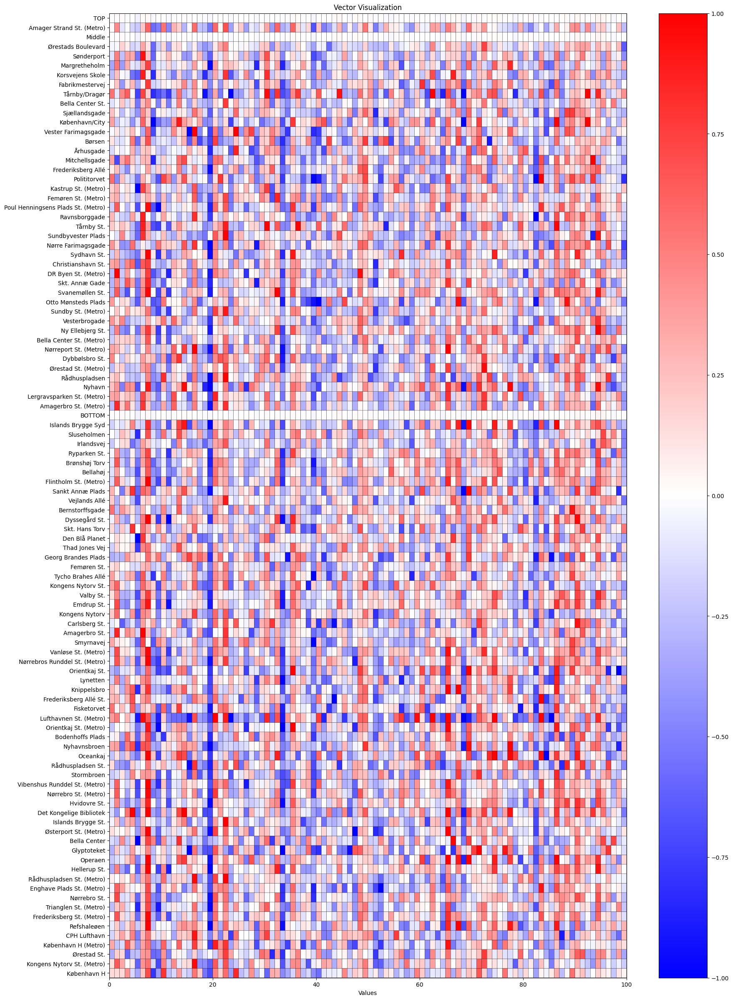

In [139]:
colors = [(0, 'blue'), (0.5, 'white'), (1, 'red')]
cmap = LinearSegmentedColormap.from_list('Color_map', colors)

# Create a figure and a single subplot
fig, ax = plt.subplots(1, 1, figsize=(20, 30))

# Create a pseudocolor plot with a single row (corresponding to the vector) and 10 columns
c = ax.pcolor(vectors.reshape(len(names), -1), cmap=cmap, vmin=-1, vmax=1, edgecolors='k')

# Set the ticks and labels for the y-axis
ax.set_yticks(np.arange(len(names)) + 0.5)
ax.set_yticklabels(names)

# Set the title and labels
ax.set_title('Vector Visualization')
ax.set_xlabel('Values')

# Show the colorbar
plt.colorbar(c, ax=ax)

# Display the plot
plt.show()

In [140]:
names_avg = ["Bottom", "Middle", "Top"]

vectors_array_top = np.array(vectors_top)
sum_top = np.sum(vectors_array_top, axis=0)
average_vector_top = sum_top / len(vectors_top)

vectors_array_middle = np.array(vectors_middle)
sum_middle = np.sum(vectors_array_middle, axis=0)
average_vector_middle = sum_middle / len(vectors_middle)

vectors_array_bottom = np.array(vectors_bottom)
sum_bottom = np.sum(vectors_array_bottom, axis=0)
average_vector_bottom = sum_bottom / len(vectors_bottom)

vectors_avg = np.array([average_vector_bottom, average_vector_middle, average_vector_top])


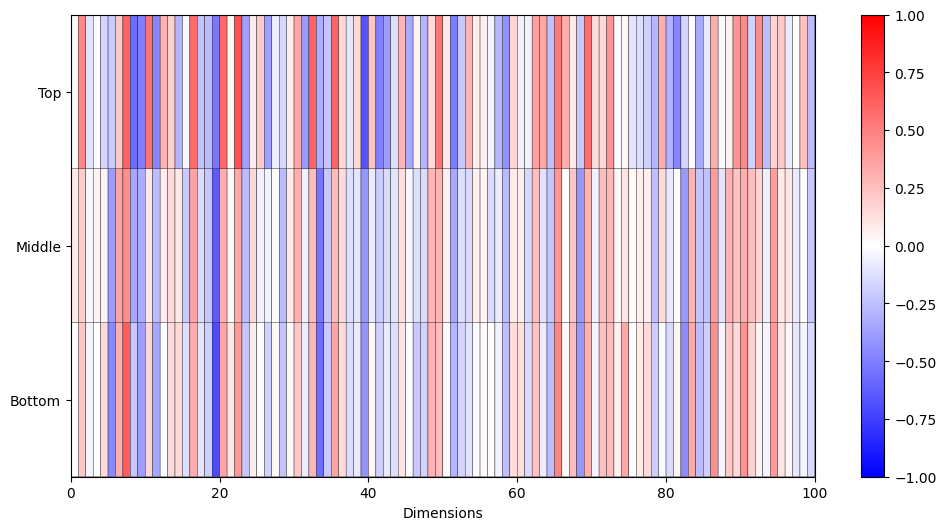

In [141]:
colors = [(0, 'blue'), (0.5, 'white'), (1, 'red')]
cmap = LinearSegmentedColormap.from_list('Color_map', colors)

# Create a figure and a single subplot
fig, ax = plt.subplots(1, 1, figsize=(12, 6))

# Create a pseudocolor plot with a single row (corresponding to the vector) and 10 columns
c = ax.pcolor(vectors_avg.reshape(len(names_avg), -1), cmap=cmap, vmin=-1, vmax=1, edgecolors='k')

# Set the ticks and labels for the y-axis
ax.set_yticks(np.arange(len(names_avg)) + 0.5)
ax.set_yticklabels(names_avg)

# Set the title and labels
#ax.set_title('Vector Visualization')
ax.set_xlabel('Dimensions')

# Show the colorbar
plt.colorbar(c, ax=ax)

# Display the plot
plt.show()

In [142]:

from numpy.linalg import norm
A = average_vector_bottom
B = average_vector_top
C = average_vector_middle
# compute cosine similarity
cosine_top_bottom = np.dot(A,B)/(norm(A)*norm(B))
cosine_top_middle = np.dot(A,C)/(norm(A)*norm(C))
cosine_middle_bottom = np.dot(B,C)/(norm(B)*norm(C))
print("Cosine Similarity top-bottom:", cosine_top_bottom)
print("Cosine Similarity top-middle:", cosine_top_middle)
print("Cosine Similarity middle-bottom:", cosine_middle_bottom)

Cosine Similarity top-bottom: 0.74271196
Cosine Similarity top-middle: 0.96080595
Cosine Similarity middle-bottom: 0.76614964


__________________________________________________________________________________________________________________________________________________________

## FINDINGS

- 8/9 of stations with count 100000+ are in bottom toe
- 1 is left (Amagerbro St. (Metro)) in the middle toe
- Those between 50000 and 100000 are split into all 3 toes

# SEMANTIC ANALYSIS OF ENTIRE PLOT

In [143]:
location_to_letter_count = {}
location_to_semantic = {}
location_to_space = {}

letter = { 3: '3-8', 9: '9-12', 13: '13-19', 20: '20-29', 30: '30-49'}
content = {'St': 'St', 'Gade': 'Gade', 'Vej': 'Vej', 'Plads': 'Plads'}
space = { 'No_space': 'No space', 'Space': 'Space'}

In [144]:
for location in journey_ids:
    location_to_letter_count[location] = len(location)
    if 'St' in location:
        location_to_semantic[location] = 'St'
    if 'Gade' in location:
        location_to_semantic[location] = 'Gade'
    if 'Vej' in location:
        location_to_semantic[location] = 'Vej'
    if 'Plads' in location:
        location_to_semantic[location] = 'Plads'
    if ' ' in location:
        location_to_space[location] = 'Space'
    if not ' ' in location:
        location_to_space[location] = 'No_space'

In [145]:
location_to_letter_counter = Counter(location_to_letter_count.values())
sorted_counts = sorted(location_to_letter_counter.items())

sorted_counts

[(3, 1),
 (4, 3),
 (5, 14),
 (6, 31),
 (7, 85),
 (8, 197),
 (9, 346),
 (10, 436),
 (11, 459),
 (12, 456),
 (13, 357),
 (14, 275),
 (15, 210),
 (16, 151),
 (17, 157),
 (18, 129),
 (19, 99),
 (20, 70),
 (21, 60),
 (22, 49),
 (23, 37),
 (24, 21),
 (25, 20),
 (26, 21),
 (27, 4),
 (28, 11),
 (29, 9),
 (30, 9),
 (31, 4),
 (32, 6),
 (33, 5),
 (34, 3),
 (35, 4),
 (36, 2),
 (37, 1),
 (39, 1),
 (40, 1),
 (41, 1),
 (42, 4),
 (45, 1),
 (49, 1)]

In [146]:
for location, letter_count in location_to_letter_count.items():
    if 3 <= letter_count <= 8:
        location_to_letter_count[location] = 3
    if 9 <= letter_count <= 12:
        location_to_letter_count[location] = 9
    if 13 <= letter_count <= 19:
        location_to_letter_count[location] = 13
    if 20 <= letter_count <= 29:
        location_to_letter_count[location] = 20
    if 30 <= letter_count <= 49:
        location_to_letter_count[location] = 30

In [147]:
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd

# Define color palette for zip codes
count_colors = {}  # Dictionary to map zip codes to colors
unique_letter_counts = sorted(letter.keys())
print(unique_letter_counts)
num_colors = len(unique_letter_counts)
color_palette = ['#ffe119', '#f58231', '#42d4f4', '#f032e6', '#e6194b']

for idx, letter_count in enumerate(unique_letter_counts):
    count_colors[letter_count] = color_palette[idx]  # Use modulo to cycle through the color palette

# Create a Pandas DataFrame
df = pd.DataFrame(data=proj_pacmap, columns=['Dimension 1', 'Dimension 2'])
df['Station Name'] = journey_ids

df['Letter_count'] = df['Station Name'].map(location_to_letter_count)

# Map counts to colors
df['Color'] = df['Letter_count'].map(count_colors)
# Create traces for each unique color
#df
import plotly.graph_objects as go

# Create traces for each unique color
legend_traces = []
for count_code, color in count_colors.items():
    # Filter DataFrame to include only rows with the current count_code
    filtered_df = df[df['Letter_count'] == count_code]
    # Create a scatter trace for this color
    trace = go.Scatter(
        x=filtered_df['Dimension 1'],
        y=filtered_df['Dimension 2'],
        mode='markers',
        marker=dict(color=color),
        name=str(count_code),  # Use count_code as legend label
        hoverinfo='text',  # Show text on hover
        text=filtered_df['Station Name'] + ' (' + filtered_df['Letter_count'].astype(str) + ')',  # Concatenate station name and count
    )
    legend_traces.append(trace)

# Add the scatter traces to the figure
fig = go.Figure(data=legend_traces)

# Update the layout
fig.update_layout(
    title="Colored by letter count",
    height=800,  # Set the height of the plot (in pixels)
    plot_bgcolor='rgba(255, 255, 255, 0.8)',  # Set plot background color to lighter one
    xaxis_title="Dimension 1",
    yaxis_title="Dimension 2",
)

# Show the plot
fig.show()



[3, 9, 13, 20, 30]


In [148]:
location_to_semantic_count = Counter(location_to_semantic.values())
sorted_semantic_counts = location_to_semantic_count.most_common()
sorted_semantic_counts

[('St', 313), ('Vej', 166), ('Plads', 109), ('Gade', 99)]

In [149]:
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd

# Define color palette for zip codes
count_colors = {}  # Dictionary to map zip codes to colors
unique_letter_counts = sorted(content.keys())
print(unique_letter_counts)
num_colors = len(unique_letter_counts)
color_palette = ['#ffe119', '#f58231', '#42d4f4', '#e6194b']

for idx, letter_count in enumerate(unique_letter_counts):
    count_colors[letter_count] = color_palette[idx]  # Use modulo to cycle through the color palette

# Create a Pandas DataFrame
df = pd.DataFrame(data=proj_pacmap, columns=['Dimension 1', 'Dimension 2'])
df['Station Name'] = journey_ids

df['Semantic'] = df['Station Name'].map(location_to_semantic)

# Map counts to colors
df['Color'] = df['Semantic'].map(count_colors)
# Create traces for each unique color
#df
import plotly.graph_objects as go

# Create traces for each unique color
legend_traces = []
for count_code, color in count_colors.items():
    # Filter DataFrame to include only rows with the current count_code
    filtered_df = df[df['Semantic'] == count_code]
    # Create a scatter trace for this color
    trace = go.Scatter(
        x=filtered_df['Dimension 1'],
        y=filtered_df['Dimension 2'],
        mode='markers',
        marker=dict(color=color),
        name=str(count_code),  # Use count_code as legend label
        hoverinfo='text',  # Show text on hover
        text=filtered_df['Station Name'] + ' (' + filtered_df['Semantic'].astype(str) + ')',  # Concatenate station name and count
    )
    legend_traces.append(trace)

# Add the scatter traces to the figure
fig = go.Figure(data=legend_traces)

# Update the layout
fig.update_layout(
    title="Colored by semantic",
    height=800,  # Set the height of the plot (in pixels)
    plot_bgcolor='rgba(255, 255, 255, 0.8)',  # Set plot background color to lighter one
    xaxis_title="Dimension 1",
    yaxis_title="Dimension 2",
)

# Show the plot
fig.show()



['Gade', 'Plads', 'St', 'Vej']


In [150]:
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd

# Define color palette for zip codes
count_colors = {}  # Dictionary to map zip codes to colors
unique_letter_counts = sorted(space.keys())
print(unique_letter_counts)
num_colors = len(unique_letter_counts)
color_palette = ['#42d4f4', '#e6194b']

for idx, letter_count in enumerate(unique_letter_counts):
    count_colors[letter_count] = color_palette[idx]  # Use modulo to cycle through the color palette

# Create a Pandas DataFrame
df = pd.DataFrame(data=proj_pacmap, columns=['Dimension 1', 'Dimension 2'])
df['Station Name'] = journey_ids

df['Space'] = df['Station Name'].map(location_to_space)

# Map counts to colors
df['Color'] = df['Space'].map(count_colors)
# Create traces for each unique color
#df
import plotly.graph_objects as go

# Create traces for each unique color
legend_traces = []
for count_code, color in count_colors.items():
    # Filter DataFrame to include only rows with the current count_code
    filtered_df = df[df['Space'] == count_code]
    # Create a scatter trace for this color
    trace = go.Scatter(
        x=filtered_df['Dimension 1'],
        y=filtered_df['Dimension 2'],
        mode='markers',
        marker=dict(color=color),
        name=str(count_code),  # Use count_code as legend label
        hoverinfo='text',  # Show text on hover
        text=filtered_df['Station Name'] + ' (' + filtered_df['Space'].astype(str) + ')',  # Concatenate station name and count
    )
    legend_traces.append(trace)

# Add the scatter traces to the figure
fig = go.Figure(data=legend_traces)

# Update the layout
fig.update_layout(
    title="Colored by space",
    height=800,  # Set the height of the plot (in pixels)
    plot_bgcolor='rgba(255, 255, 255, 0.8)',  # Set plot background color to lighter one
    xaxis_title="Dimension 1",
    yaxis_title="Dimension 2",
)

# Show the plot
fig.show()



['No_space', 'Space']


# NETWORK

In [151]:
import plotly.graph_objects as go
import networkx as nx
import pandas as pd

sequences = sequences

# Create empty NetworkX Graph
G = nx.Graph()

# Add nodes for each cluster in the dataframes
#clusters = [filtered_top, filtered_middle, filtered_bottom]
clusters = [filtered_top]
#idx 0 = top, 1 = middle, 2 = bottom
for idx, cluster_df in enumerate(clusters):
    for _, row in cluster_df.iterrows():
        G.add_node(row['Station Name'], pos=(row['Dimension 1'], row['Dimension 2']), cluster=idx, location=row['Station Name'])

number_cluster1_edges_inside = 0
# Add edges between nodes that appear together in journeys
for sequence in sequences:
    for i in range(len(sequence) - 1):  # iterate over each journey
        node1, node2 = sequence[i], sequence[i+1]
        if G.has_node(node1) and G.has_node(node2):
            number_cluster1_edges_inside += 1
            G.add_edge(node1, node2)

print(number_cluster1_edges_inside)
# Count the number of links within each cluster and outgoing links to other clusters
num_links_within_cluster = [0] * len(clusters)
num_outgoing_links = [0] * len(clusters)


# Extract node positions and cluster information
pos = nx.get_node_attributes(G, 'pos')
node_clusters = [G.nodes[node]['cluster'] for node in G.nodes]
node_stations = [G.nodes[node]['location'] for node in G.nodes()]

# Create edge trace
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

# Create node trace
node_x = [pos[node][0] for node in G.nodes]
node_y = [pos[node][1] for node in G.nodes]

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    text=node_stations,  # Use station names as text labels
    textposition="top center",  # Position of text labels
    marker=dict(
        showscale=True,
        colorscale='YlGnBu',
        reversescale=True,
        color=node_clusters,  # Color nodes by cluster
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line_width=2))

# Create Plotly figure
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(title='Top cluster'))

# Display plot
fig.show()


0


In [152]:
import plotly.graph_objects as go
import networkx as nx
import pandas as pd

sequences = sequences

# Create empty NetworkX Graph
G = nx.Graph()

# Add nodes for each cluster in the dataframes
#clusters = [filtered_top, filtered_middle, filtered_bottom]
clusters = [filtered_middle]
#idx 0 = top, 1 = middle, 2 = bottom
for idx, cluster_df in enumerate(clusters):
    for _, row in cluster_df.iterrows():
        G.add_node(row['Station Name'], pos=(row['Dimension 1'], row['Dimension 2']), cluster=idx, location=row['Station Name'])

number_cluster1_edges_inside = 0
# Add edges between nodes that appear together in journeys
for sequence in sequences:
    for i in range(len(sequence) - 1):  # iterate over each journey
        node1, node2 = sequence[i], sequence[i+1]
        if G.has_node(node1) and G.has_node(node2):
            number_cluster1_edges_inside += 1
            G.add_edge(node1, node2)

print(number_cluster1_edges_inside)
# Count the number of links within each cluster and outgoing links to other clusters
num_links_within_cluster = [0] * len(clusters)
num_outgoing_links = [0] * len(clusters)


# Extract node positions and cluster information
pos = nx.get_node_attributes(G, 'pos')
node_clusters = [G.nodes[node]['cluster'] for node in G.nodes]
node_stations = [G.nodes[node]['location'] for node in G.nodes()]

# Create edge trace
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

# Create node trace
node_x = [pos[node][0] for node in G.nodes]
node_y = [pos[node][1] for node in G.nodes]

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    text=node_stations,  # Use station names as text labels
    textposition="top center",  # Position of text labels
    marker=dict(
        showscale=True,
        colorscale='YlGnBu',
        reversescale=True,
        color=node_clusters,  # Color nodes by cluster
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line_width=2))

# Create Plotly figure
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(title='Middle cluster'))

# Display plot
fig.show()


85907


In [153]:
import plotly.graph_objects as go
import networkx as nx
import pandas as pd

sequences = sequences

# Create empty NetworkX Graph
G = nx.Graph()

# Add nodes for each cluster in the dataframes
#clusters = [filtered_top, filtered_middle, filtered_bottom]
clusters = [filtered_bottom]
#idx 0 = top, 1 = middle, 2 = bottom
for idx, cluster_df in enumerate(clusters):
    for _, row in cluster_df.iterrows():
        G.add_node(row['Station Name'], pos=(row['Dimension 1'], row['Dimension 2']), cluster=idx, location=row['Station Name'])

number_cluster1_edges_inside = 0
# Add edges between nodes that appear together in journeys
for sequence in sequences:
    if 'København H' in sequence: 
        for i in range(len(sequence) - 1):  # iterate over each journey
            node1, node2 = sequence[i], sequence[i+1]
            if G.has_node(node1) and G.has_node(node2):
                number_cluster1_edges_inside += 1
                G.add_edge(node1, node2)

print(number_cluster1_edges_inside)
# Count the number of links within each cluster and outgoing links to other clusters
num_links_within_cluster = [0] * len(clusters)
num_outgoing_links = [0] * len(clusters)


# Extract node positions and cluster information
pos = nx.get_node_attributes(G, 'pos')
node_clusters = [G.nodes[node]['cluster'] for node in G.nodes]
node_stations = [G.nodes[node]['location'] for node in G.nodes()]

# Create edge trace
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

# Create node trace
node_x = [pos[node][0] for node in G.nodes]
node_y = [pos[node][1] for node in G.nodes]

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    text=node_stations,  # Use station names as text labels
    textposition="top center",  # Position of text labels
    marker=dict(
        showscale=True,
        colorscale='YlGnBu',
        reversescale=True,
        color=node_clusters,  # Color nodes by cluster
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line_width=2))

# Create Plotly figure
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(title='Bottom cluster'))

# Display plot
fig.show()


232525


In [154]:
count = 0
for seq in sequences:
    if 'København H' in seq:  # Checking if 'København H' is in the sequence
        count += 1

count




560978

In [155]:
new_sequences = []

In [156]:
top_locations = filtered_top['Station Name'].tolist()
middle_locations = filtered_middle['Station Name'].tolist()
bottom_locations = filtered_bottom['Station Name'].tolist()

In [157]:
internal_top = 0
internal_middle = 0
internal_bottom = 0
from_top_out = 0
from_middle_out = 0
from_bottom_out = 0
to_top = 0
to_middle = 0
to_bottom = 0

for seq in sequences:
        loc1, loc2 = seq[0], seq[1]
        if loc1 in top_locations:
            if loc2 in top_locations:
                internal_top += 1
            elif loc2 in middle_locations:
                from_top_out += 1
                to_middle += 1
            elif loc2 in bottom_locations:
                from_top_out += 1
                to_bottom += 1
        elif loc1 in middle_locations:
            if loc2 in middle_locations:
                internal_middle +=1
            elif loc2 in top_locations:
                from_middle_out += 1
                to_top += 1
            elif loc2 in bottom_locations:
                from_middle_out += 1
                to_bottom += 1
        elif loc1 in bottom_locations:
            if loc2 in bottom_locations:
                internal_bottom += 1
            elif loc2 in top_locations:
                from_bottom_out += 1
                to_top += 1
            elif loc2 in middle_locations:
                from_bottom_out += 1
                to_middle += 1

print("Internal top: ", internal_top)
print("Going out from top: ", from_top_out)
print("Going into top: ", to_top)
print("Internal middle: ", internal_middle)
print("Going out from middle: ", from_middle_out)
print("Going into middle: ", to_middle)
print("Internal bottom: ", internal_bottom)
print("Going out from bottom: ", from_bottom_out)
print("Going into bottom: ", to_bottom)

Internal top:  0
Going out from top:  12372
Going into top:  12838
Internal middle:  85907
Going out from middle:  221131
Going into middle:  264995
Internal bottom:  599784
Going out from bottom:  270809
Going into bottom:  226479


In [158]:
# 560978 Kbh H

#internal_top + internal_middle + internal_bottom + from_top_out + from_middle_out + from_bottom_out + to_top + to_middle + to_bottom
total_top = internal_top + from_top_out + to_top
total_middel = internal_middle + from_middle_out + to_middle
total_bottom = internal_bottom + from_bottom_out + to_bottom

internal_top_pr = internal_bottom/total_bottom*100
from_top_pr = from_bottom_out/total_bottom*100
to_top_pr = to_bottom/total_bottom*100

print(internal_top_pr)
print(from_top_pr)
print(to_top_pr)

54.67134335759184
24.684706199775402
20.643950442632754


In [159]:
import plotly.graph_objects as go
import networkx as nx
import pandas as pd

sequences = sequences

# Create empty NetworkX Graph
G = nx.Graph()

# Add nodes for each cluster in the dataframes
clusters = [filtered_top, filtered_middle, filtered_bottom]
#idx 0 = top, 1 = middle, 2 = bottom
for idx, cluster_df in enumerate(clusters):
    for _, row in cluster_df.iterrows():
        G.add_node(row['Station Name'], pos=(row['Dimension 1'], row['Dimension 2']), cluster=idx, location=row['Station Name'])

from_cluster_out = {0: 0, 1: 0, 2:0}
from_out_going_in = {0: 0, 1: 0, 2:0}
# Add edges between nodes that appear together in journeys
for sequence in sequences:
    if 'København H' in sequence:
        for i in range(len(sequence) - 1):  # iterate over each journey
            node1, node2 = sequence[i], sequence[i+1]
            if G.has_node(node1) and G.has_node(node2):
                cluster1 = G.nodes[node1]['cluster']
                cluster2 = G.nodes[node2]['cluster']
                if cluster1 != cluster2:
                    from_cluster_out[cluster1] +=1
                    from_out_going_in[cluster2] +=1
                G.add_edge(node1, node2, cluster=cluster1)

print(from_cluster_out)
print(from_out_going_in)
# Extract node positions and cluster information
pos = nx.get_node_attributes(G, 'pos')
node_clusters = [G.nodes[node]['cluster'] for node in G.nodes]
node_stations = [G.nodes[node]['location'] for node in G.nodes()]

# Create edge trace
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

# Create node trace
node_x = [pos[node][0] for node in G.nodes]
node_y = [pos[node][1] for node in G.nodes]

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    text=node_stations,  # Use station names as text labels
    textposition="top center",  # Position of text labels
    marker=dict(
        showscale=True,
        colorscale='YlGnBu',
        reversescale=True,
        color=node_clusters,  # Color nodes by cluster
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line_width=2))

# Create Plotly figure
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(title='Three clusters'))

# Display plot
fig.show()


{0: 876, 1: 37138, 2: 38789}
{0: 859, 1: 37930, 2: 38014}


## BETWEEN THE CLUSTERS

### BETWEEN TOP AND BOTTOM

In [160]:
import plotly.graph_objects as go
import networkx as nx
import pandas as pd

sequences = sequences

# Create empty NetworkX Graph
G = nx.Graph()

# Add nodes for each cluster in the dataframes
clusters = [filtered_top, filtered_bottom]
#idx 0 = top, 1 = middle, 2 = bottom
for idx, cluster_df in enumerate(clusters):
    for _, row in cluster_df.iterrows():
        G.add_node(row['Station Name'], pos=(row['Dimension 1'], row['Dimension 2']), cluster=idx, location=row['Station Name'])

cluster_to_outgoing_links = {0: 0, 1: 0, 2:0}
# Add edges between nodes that appear together in journeys
for sequence in sequences:
    for i in range(len(sequence) - 1):  # iterate over each journey
        node1, node2 = sequence[i], sequence[i+1]
        if G.has_node(node1) and G.has_node(node2):
            cluster1 = G.nodes[node1]['cluster']
            cluster2 = G.nodes[node2]['cluster']
            if cluster1 != cluster2:
                cluster_to_outgoing_links[cluster1] +=1
                cluster_to_outgoing_links[cluster2] +=1
            G.add_edge(node1, node2)

print(cluster_to_outgoing_links)
# Extract node positions and cluster information
pos = nx.get_node_attributes(G, 'pos')
node_clusters = [G.nodes[node]['cluster'] for node in G.nodes]
node_stations = [G.nodes[node]['location'] for node in G.nodes()]

# Create edge trace
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

# Create node trace
node_x = [pos[node][0] for node in G.nodes]
node_y = [pos[node][1] for node in G.nodes]

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    text=node_stations,  # Use station names as text labels
    textposition="top center",  # Position of text labels
    marker=dict(
        showscale=True,
        colorscale='YlGnBu',
        reversescale=True,
        color=node_clusters,  # Color nodes by cluster
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line_width=2))

# Create Plotly figure
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(title='Top and bottom'))

# Display plot
fig.show()


{0: 18186, 1: 18186, 2: 0}


### BETWEEN BOTTOM AND MIDDLE

In [161]:
import plotly.graph_objects as go
import networkx as nx
import pandas as pd

sequences = sequences

# Create empty NetworkX Graph
G = nx.Graph()

# Add nodes for each cluster in the dataframes
clusters = [filtered_middle, filtered_bottom]
#idx 0 = top, 1 = middle, 2 = bottom
for idx, cluster_df in enumerate(clusters):
    for _, row in cluster_df.iterrows():
        G.add_node(row['Station Name'], pos=(row['Dimension 1'], row['Dimension 2']), cluster=idx, location=row['Station Name'])

cluster_to_outgoing_links = {0: 0, 1: 0, 2:0}
# Add edges between nodes that appear together in journeys
for sequence in sequences:
    for i in range(len(sequence) - 1):  # iterate over each journey
        node1, node2 = sequence[i], sequence[i+1]
        if G.has_node(node1) and G.has_node(node2):
            cluster1 = G.nodes[node1]['cluster']
            cluster2 = G.nodes[node2]['cluster']
            if cluster1 != cluster2:
                cluster_to_outgoing_links[cluster1] +=1
                cluster_to_outgoing_links[cluster2] +=1
            G.add_edge(node1, node2)

print(cluster_to_outgoing_links)
# Extract node positions and cluster information
pos = nx.get_node_attributes(G, 'pos')
node_clusters = [G.nodes[node]['cluster'] for node in G.nodes]
node_stations = [G.nodes[node]['location'] for node in G.nodes()]

# Create edge trace
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

# Create node trace
node_x = [pos[node][0] for node in G.nodes]
node_y = [pos[node][1] for node in G.nodes]

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    text=node_stations,  # Use station names as text labels
    textposition="top center",  # Position of text labels
    marker=dict(
        showscale=True,
        colorscale='YlGnBu',
        reversescale=True,
        color=node_clusters,  # Color nodes by cluster
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line_width=2))

# Create Plotly figure
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(title='Middle and bottom'))

# Display plot
fig.show()


{0: 479102, 1: 479102, 2: 0}


### BETWEEN TOP AND MIDDLE

In [162]:
import plotly.graph_objects as go
import networkx as nx
import pandas as pd

sequences = sequences

# Create empty NetworkX Graph
G = nx.Graph()

# Add nodes for each cluster in the dataframes
clusters = [filtered_top, filtered_middle]
#idx 0 = top, 1 = middle, 2 = bottom
for idx, cluster_df in enumerate(clusters):
    for _, row in cluster_df.iterrows():
        G.add_node(row['Station Name'], pos=(row['Dimension 1'], row['Dimension 2']), cluster=idx, location=row['Station Name'])

cluster_to_outgoing_links = {0: 0, 1: 0, 2:0}
# Add edges between nodes that appear together in journeys
for sequence in sequences:
    for i in range(len(sequence) - 1):  # iterate over each journey
        node1, node2 = sequence[i], sequence[i+1]
        if G.has_node(node1) and G.has_node(node2):
            cluster1 = G.nodes[node1]['cluster']
            cluster2 = G.nodes[node2]['cluster']
            if cluster1 != cluster2:
                cluster_to_outgoing_links[cluster1] +=1
                cluster_to_outgoing_links[cluster2] +=1
            G.add_edge(node1, node2)

print(cluster_to_outgoing_links)
# Extract node positions and cluster information
pos = nx.get_node_attributes(G, 'pos')
node_clusters = [G.nodes[node]['cluster'] for node in G.nodes]
node_stations = [G.nodes[node]['location'] for node in G.nodes()]

# Create edge trace
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

# Create node trace
node_x = [pos[node][0] for node in G.nodes]
node_y = [pos[node][1] for node in G.nodes]

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    text=node_stations,  # Use station names as text labels
    textposition="top center",  # Position of text labels
    marker=dict(
        showscale=True,
        colorscale='YlGnBu',
        reversescale=True,
        color=node_clusters,  # Color nodes by cluster
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line_width=2))

# Create Plotly figure
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(title='Top and middle'))

# Display plot
fig.show()


{0: 7024, 1: 7024, 2: 0}


In [163]:
# import plotly.graph_objects as go
# import networkx as nx
# import pandas as pd

# sequences = sequences
# color_map = {0: 'lightpink', 1: 'saddlebrown', 2: 'khaki'}

# # Create empty NetworkX Graph
# G = nx.Graph()

# # Add nodes for each cluster in the dataframes
# clusters = [filtered_top, filtered_middle, filtered_bottom]
# # idx 0 = top, 1 = middle, 2 = bottom
# for idx, cluster_df in enumerate(clusters):
#     for _, row in cluster_df.iterrows():
#         G.add_node(row['Station Name'], pos=(row['Dimension 1'], row['Dimension 2']), cluster=idx,
#                    location=row['Station Name'])

# cluster_to_outgoing_links = {0: 0, 1: 0, 2: 0}
# # Add edges between nodes that appear together in journeys
# for sequence in sequences:
#     for i in range(len(sequence) - 1):  # iterate over each journey
#         node1, node2 = sequence[i], sequence[i + 1]
#         if G.has_node(node1) and G.has_node(node2):
#             cluster1 = G.nodes[node1]['cluster']
#             cluster2 = G.nodes[node2]['cluster']
#             if cluster1 != cluster2:
#                 cluster_to_outgoing_links[cluster1] += 1
#                 cluster_to_outgoing_links[cluster2] += 1
#             G.add_edge(node1, node2, cluster=cluster1)  # Add cluster information to the edge

# print(cluster_to_outgoing_links)
# # Extract node positions and cluster information
# pos = nx.get_node_attributes(G, 'pos')
# node_clusters = [G.nodes[node]['cluster'] for node in G.nodes]
# node_stations = [G.nodes[node]['location'] for node in G.nodes()]

# print(node_clusters)
# # Create edge trace
# edge_x = []
# edge_y = []
# edge_colors = []  # List to store edge colors based on cluster
# for edge in G.edges():
#     x0, y0 = pos[edge[0]]
#     x1, y1 = pos[edge[1]]
#     edge_x.extend([x0, x1, None])
#     edge_y.extend([y0, y1, None])
#     # Get the color of the edge based on the cluster it originates from
#     color=G.edges[edge]['cluster']
#     edge_colors.append(color)

# print(edge_colors)

# edge_trace = go.Scatter(
#     x=edge_x, y=edge_y,
#     line=dict(width=0.5, color=[color_map[edge_color] for edge_color in edge_colors]),  # Use edge colors
#     hoverinfo='none',
#     mode='lines')

# # Create node trace
# node_x = [pos[node][0] for node in G.nodes]
# node_y = [pos[node][1] for node in G.nodes]

# node_trace = go.Scatter(
#     x=node_x, y=node_y,
#     mode='markers',
#     hoverinfo='text',
#     text=node_stations,  # Use station names as text labels
#     textposition="top center",  # Position of text labels
#     marker=dict(
#         showscale=True,
#         colorscale='YlGnBu',
#         reversescale=True,
#         color=node_clusters,  # Color nodes by cluster
#         size=10,
#         colorbar=dict(
#             thickness=15,
#             title='Node Connections',
#             xanchor='left',
#             titleside='right'
#         ),
#         line_width=2))

# # Create Plotly figure
# fig = go.Figure(data=[edge_trace, node_trace],
#                 layout=go.Layout(title='Three clusters'))

# # Display plot
# fig.show()


# GEOGRAPHY

In [164]:
df = pd.DataFrame(data=journey_ids, columns=['Location'])
# df['Station Name'] = journey_ids
df


,Location
0,København H
1,Borrebyvej
2,Hulgårds Plads
3,Islands Brygge St. (Metro)
4,København H (Metro)
...,...
3746,Sydstrandsvej
3747,Pildamsvej
3748,Poppelhøj
3749,CBS Handelshøjskolen


In [165]:
# Define a function to retrieve latitude and longitude for a location
def get_lat(location):
    for address, info in data.items():
        if address == location:
            if info is not None:
                return info['latitude']
    return None, None  # Return None if coordinates not found


# Define a function to retrieve latitude and longitude for a location
def get_long(location):
    for address, info in data.items():
        if address == location:
            if info is not None:
                return info['longitude']
    return None, None  # Return None if coordinates not found


In [166]:
#Add latitude and logitude to all possible

filtered_top['Latitude'] = filtered_top['Station Name'].apply(get_lat)
filtered_top['Longitude'] = filtered_top['Station Name'].apply(get_long)
filtered_top.loc[filtered_top['Station Name'] == 'Københavns Lufthavn St. (Metro)', 'Latitude'] = 55.6305318239452
filtered_top.loc[filtered_top['Station Name'] == 'Københavns Lufthavn St. (Metro)', 'Longitude'] = 12.649306113221607
filtered_top.loc[filtered_top['Station Name'] == 'Gammel Strand St.', 'Latitude'] = 55.677864311866976
filtered_top.loc[filtered_top['Station Name'] == 'Gammel Strand St.', 'Longitude'] = 12.579574697878703
filtered_top.loc[filtered_top['Station Name'] == 'Ørestad/Sundby', 'Latitude'] = 55.62913371328766
filtered_top.loc[filtered_top['Station Name'] == 'Ørestad/Sundby', 'Longitude'] = 12.579388797876002
filtered_top = filtered_top.drop(filtered_top[filtered_top['Latitude'] == (None, None)].index)


filtered_middle['Latitude'] = filtered_middle['Station Name'].apply(get_lat)
filtered_middle['Longitude'] = filtered_middle['Station Name'].apply(get_long)
filtered_middle = filtered_middle.drop(filtered_middle[filtered_middle['Station Name'] == 'Tårnby/Dragør'].index)
filtered_middle = filtered_middle.drop(filtered_middle[filtered_middle['Latitude'] == (None, None)].index)


filtered_bottom['Latitude'] = filtered_bottom['Station Name'].apply(get_lat)
filtered_bottom['Longitude'] = filtered_bottom['Station Name'].apply(get_long)
filtered_bottom.loc[filtered_bottom['Station Name'] == 'Øresund St.', 'Latitude'] = 55.66146296004894
filtered_bottom.loc[filtered_bottom['Station Name'] == 'Øresund St.', 'Longitude'] = 12.628759724859536
filtered_bottom.loc[filtered_bottom['Station Name'] == 'Skt. Hans Torv', 'Latitude'] = 55.69078322648737
filtered_bottom.loc[filtered_bottom['Station Name'] == 'Skt. Hans Torv', 'Longitude'] = 12.560940555552214
filtered_bottom.loc[filtered_bottom['Station Name'] == 'Islands Brygge Syd', 'Latitude'] = 55.65611392298458
filtered_bottom.loc[filtered_bottom['Station Name'] == 'Islands Brygge Syd', 'Longitude'] = 12.564129185262397
filtered_bottom.loc[filtered_bottom['Station Name'] == 'Øresund St.', 'Longitude'] = 12.628759724859536
filtered_bottom.loc[filtered_bottom['Station Name'] == 'Øresund St.', 'Zip'] = 2300
filtered_bottom.loc[filtered_bottom['Station Name'] == 'Hellerup St.', 'Zip'] = 2600
filtered_bottom = filtered_bottom.drop(filtered_bottom[filtered_bottom['Latitude'] == (None, None)].index)


filtered_middle



ValueError: Length of values (2) does not match length of index (1)

In [ ]:
import folium
from IPython.display import IFrame


# Create a map centered around Copenhagen
copenhagen_map = folium.Map(location=[55.6761, 12.5683], zoom_start=12)


# Add markers to the map for points from the first dataframe (filtered_top) with gray color
for index, row in filtered_top.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Station Name'], icon=folium.Icon(color='black')).add_to(copenhagen_map)

# Add markers to the map for points from the second dataframe (filtered_middle) with blue color
for index, row in filtered_middle.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Station Name'], icon=folium.Icon(color='blue')).add_to(copenhagen_map)

# Add markers to the map for points from the third dataframe (filtered_bottom) with green color
for index, row in filtered_bottom.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Station Name'], icon=folium.Icon(color='white')).add_to(copenhagen_map)

# Create a legend
legend_html = '''
     <div style="position: fixed; 
                 bottom: 50px; left: 50px; width: 130px; height: 90px; 
                 border:2px solid grey; z-index:9999; font-size:14px;
                 background-color:white;
                 ">&nbsp; <b>Clusters</b> <br>
                   &nbsp; Top: Black <br>
                   &nbsp; Middle: Blue <br>
                   &nbsp; Bottom: White <br>
     </div>
     '''

# Add legend to the map
copenhagen_map.get_root().html.add_child(folium.Element(legend_html)) # type: ignore

# Display the map
copenhagen_map

